In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import networkx as nx
from os import path

## Targeted approach evaluation

In [2]:
def valid(s):
    return(int(s.strip('.txt').split('_')[2]))

def vector_extractor(sample, centrality):
    x = df.loc[(df[0]== sample) & (df[2]== centrality), list(range(3, df.shape[1]))].to_numpy()[0]
    p = df_g.loc[(df_g[0]== sample) & (df_g[2]== centrality), list(range(3, df_g.shape[1]))].to_numpy()[0]
    return x, p

def mean_value(sample, centrality):
    x,_ = vector_extractor(sample, centrality)
    cent =dict()
    cent['mean'] = np.mean(x)
    cent['var']=  np.var(x)
    return cent

def group_centerality(sample, centrality):
    x,p = vector_extractor(sample, centrality)

    grp_cent = dict()
    for i in [0, 1, -1]:
        idx = (p == i)& (~np.isnan(x))
        if np.sum(idx)> 0:
            grp_cent[i] =  np.sum(x[idx])/np.sum(idx)
        else:
            grp_cent[i] = None
    return grp_cent

def oredered_avg(sampler, centrality):
    return df.loc[(df[1]== sampler) & (df[2]== centrality), list(range(3, df.shape[1]))]

def draw(graph, my_evaluator = None):
    if my_evaluator is None:        
        plt.figure(num=None, figsize=(40, 40), dpi=30)
        plt.axis('off')
        fig = plt.figure(1)
        pos = nx.spring_layout(graph)
        nx.draw_networkx_nodes(graph,pos)
        nx.draw_networkx_edges(graph,pos)
        plt.show()
    else:
        plt.figure(num=None, figsize=(40, 40), dpi=30)
        plt.axis('off')
        fig = plt.figure(1)
        pos = nx.spring_layout(graph) 
        
        harmonic = nx.harmonic_centrality(graph)
        for node in harmonic.keys():
            harmonic[node] = np.round(harmonic[node]/my_evaluator.cents.loc[node, 'harmonic'], 3)
        gender_1 = set(my_evaluator.users[my_evaluator.users.gender == 1].index).intersection(set(graph.nodes()))
        gender_0 = set(my_evaluator.users[my_evaluator.users.gender == 0].index).intersection(set(graph.nodes()))
        gender_x = set(my_evaluator.users[my_evaluator.users.gender == -1].index).intersection(set(graph.nodes()))
        target = set(my_evaluator.target)
        
        nodes = list(target.intersection(gender_1))
        node_size = list()
        for node in nodes:
            node_size.append(200 + int(10000*harmonic[node]))
        nx.draw_networkx_nodes(graph, pos, nodelist = nodes, node_shape = 's', node_size= node_size)
        #print(node_size)
        nodes = list(target.intersection(gender_0))
        node_size = list()
        for node in nodes:
            node_size.append(200 + int(10000*harmonic[node]))
        nx.draw_networkx_nodes(graph, pos, nodelist =nodes , node_shape = 's', node_color = 'r', node_size= node_size)
        #print(node_size)
        nodes = list(target.intersection(gender_x))
        node_size = list()
        for node in nodes:
            node_size.append(200 + int(10000*harmonic[node]))
        nx.draw_networkx_nodes(graph, pos, nodelist = nodes , node_shape = 's', node_color = 'g', node_size= node_size)
        #print(node_size)
        nodes = list(gender_0-target)
        node_size = list()
        for node in nodes:
            node_size.append(200 + int(10000*harmonic[node]))
        nx.draw_networkx_nodes(graph, pos, nodelist = nodes, node_color = 'r', node_size= node_size)
        #print(node_size)
        nodes = list(gender_1-target)
        node_size = list()
        for node in nodes:
            node_size.append(200 + int(10000*harmonic[node]))        
        nx.draw_networkx_nodes(graph, pos, nodelist = nodes, node_size= node_size)
        #print(node_size)
        nodes = list(gender_x-target)
        node_size = list()
        for node in nodes:
            node_size.append(200 + int(10000*harmonic[node]))        
        nx.draw_networkx_nodes(graph, pos, nodelist = nodes, node_color = 'g', node_size= node_size)
        #print(node_size)
        nx.draw_networkx_edges(graph,pos, alpha =0.5)
        nx.draw_networkx_labels(graph,pos,harmonic,font_size =20)
        plt.show()

# Facebook

## Targeted approach evaluation


In [7]:
class Args:
    def __init__(self):
        self.path = './data/Facebook/'
        self.sample_path = './samples/'
        self.undirected = 1
        self.ego_exist = 0

class Evaluator:
    def __init__(self, args, print_ = True):
        self.args = args
        self.print_ = print_
        self.__samples_dirctor = self.args.sample_path + 'targeted/'+self.args.path.split('./data/')[1]
        self.__load_data()
        self.target = list(self.cents.loc[self.users[self.users.gender == 1].index, 'harmonic'].nlargest().index)
        self.target += list(self.cents.loc[self.users[self.users.gender == 0].index, 'harmonic'].nlargest().index) 
        self.map_node_group = dict()
        self.group_size = np.zeros(2)
        for node in self.target:
            grp = self.users.loc[node, 'gender']
            self.map_node_group[node] = grp
            self.group_size[grp] +=1
            
    def sample_list(self):        
        files = os.listdir(self.__samples_dirctor)
        files =[file for file in files if '.txt' in file]
        return files
        
    def evaluate_sample(self, sample):    
        nodes = self.load_sample(sample)
        edges = self.__induced_subgraph(nodes)   
        edges.columns = ['source', 'target']
        graph = nx.from_pandas_edgelist(edges)
        harmonic = nx.harmonic_centrality(graph)
        row = dict()
        row['sample'] = sample
        row['sample_size']= int(sample.split('_')[1])
        row['sampler'] = sample.split('_')[0]
        total_sum = 0
        group_sum = np.zeros(2)
        for node in self.target:
            row[node] = harmonic[node]/self.cents.loc[node,'harmonic']
            total_sum += row[node]
            group_sum[self.map_node_group[node]] += row[node]
        group_sum = group_sum/self.group_size 
        row['total_sum'] = total_sum        
        row['grp_0'] = group_sum[0] 
        row['grp_1'] = group_sum[1] 
        pagerank = nx.pagerank(graph, alpha=0.85)
        p_s = np.zeros(len(self.target))
        p_o = np.zeros(len(self.target))
        for idx, node in enumerate(my_evaluator.target):
            p_s[idx] = pagerank[node]
            p_o[idx] = self.cents.loc[node, 'pagerank']
        row['pagerank_L2'] = np.round(np.sqrt(np.sum(np.power(p_s-p_o,2))),4)
        
#         cc = nx.clustering(graph)
#         p_s = np.zeros(len(self.target))
#         p_o = np.zeros(len(self.target))
#         for idx, node in enumerate(my_evaluator.target):
#             p_s[idx] = cc[node]
#             p_o[idx] = self.cents.loc[node, 'CC']
#         row['CC_L2'] = np.round(np.sqrt(np.sum(np.power(p_s-p_o,2))),4)   
        return row, graph
        
    def load_sample(self, sample):
        nodes = open(self.__samples_dirctor +sample , 'r').readline().strip()
        nodes = [int(node) for node in nodes.split(' ')]
        return nodes
    
    def __induced_subgraph(self, nodes):
        return self.__edges[self.__edges.src.isin(nodes) & self.__edges.dst.isin(nodes)] 
    
    def __load_data(self):
            self.__edges = pd.read_csv(self.args.path + 'relations.csv')[['src', 'dst']]
            self.users = pd.read_csv(self.args.path + 'usersdata.csv' ).set_index('user_id')
            self.cents = pd.read_csv(self.args.path + 'node_centralities.csv', index_col=0)

In [8]:
args = Args()    
my_evaluator = Evaluator(args, print_ = False)

BFS_100_0.txt 

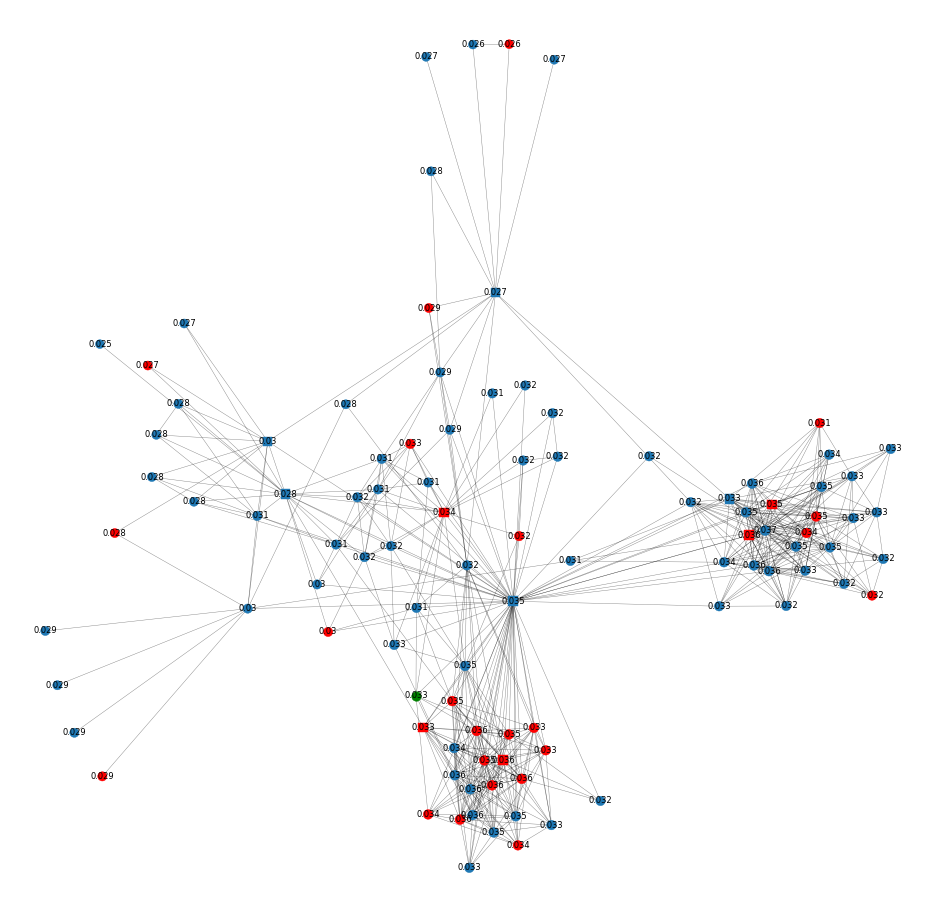

DFS_100_0.txt 

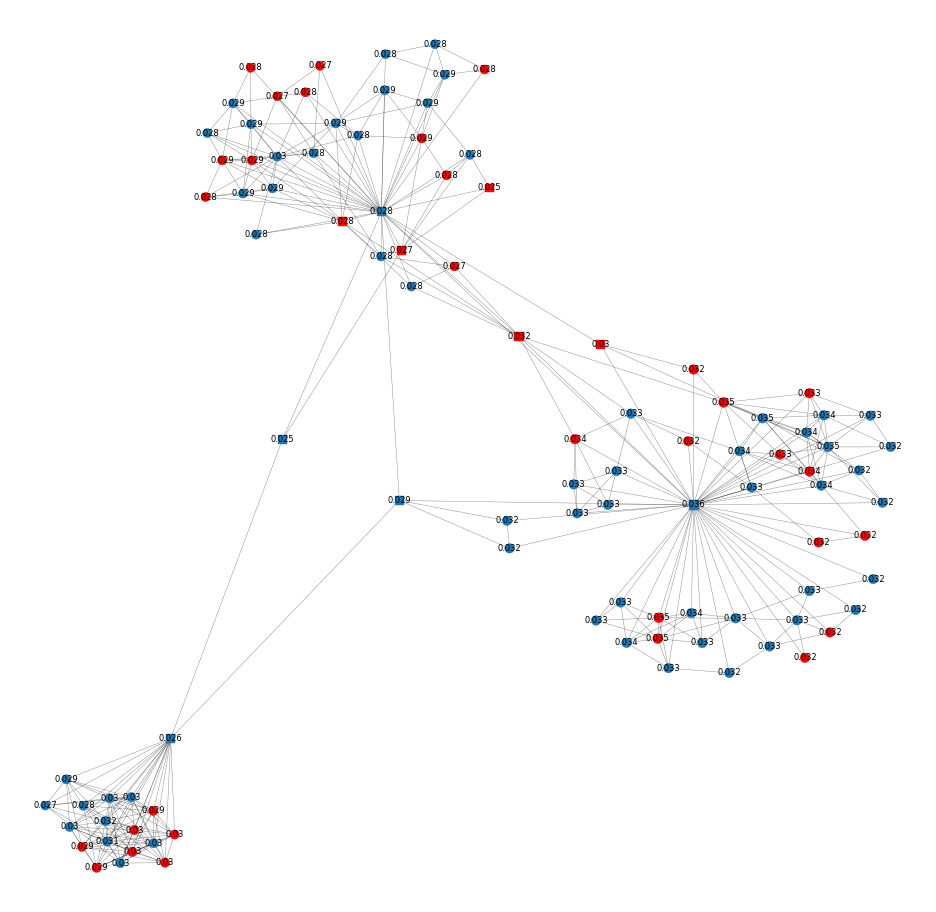

RW_100_0.txt 

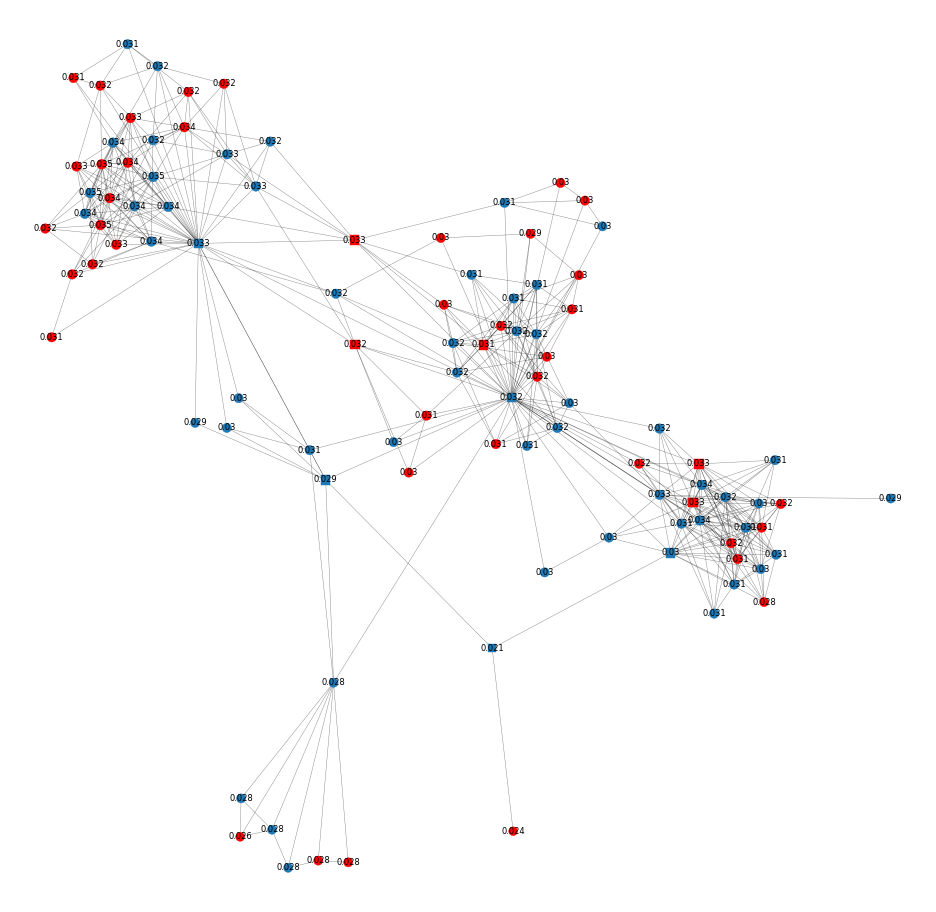

NS_100_0.txt 

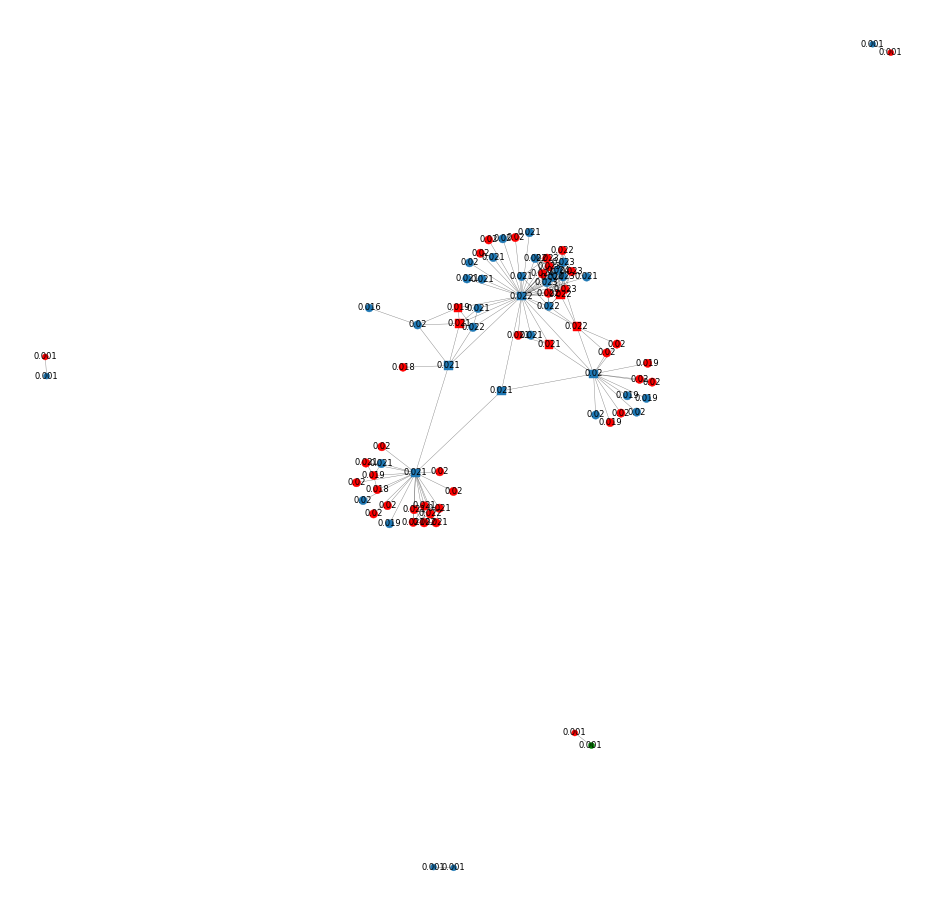

GG_100_0.txt 

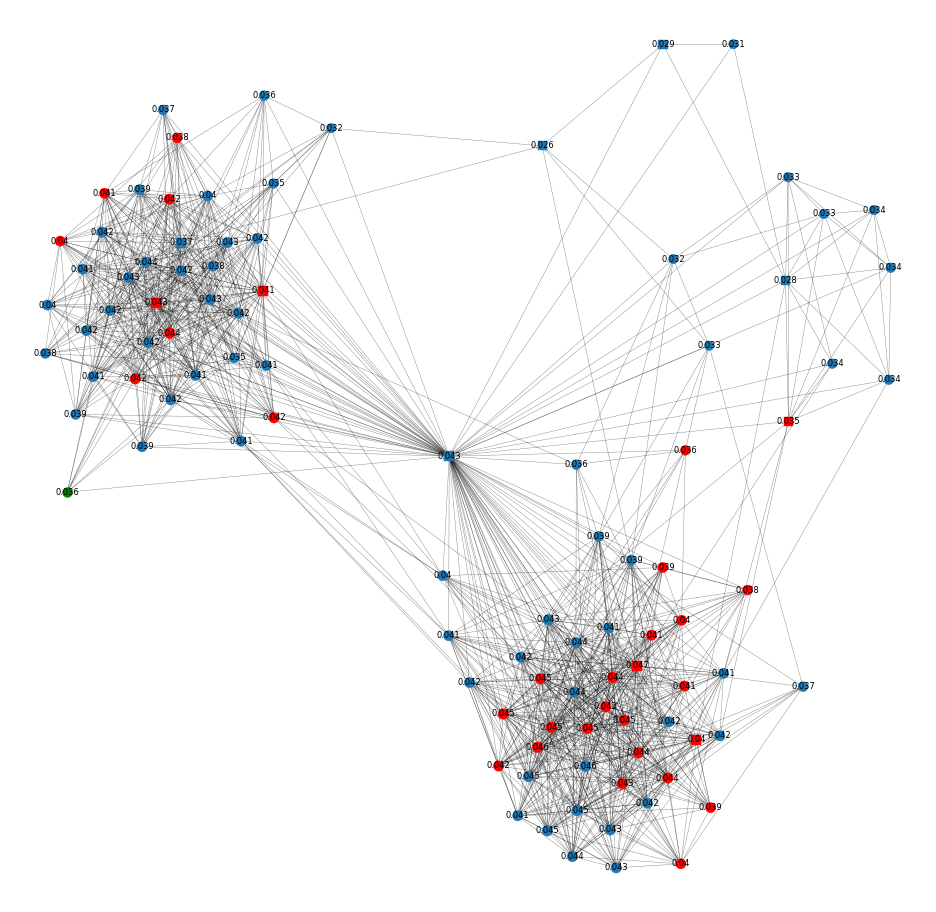

GF_100_0.txt 

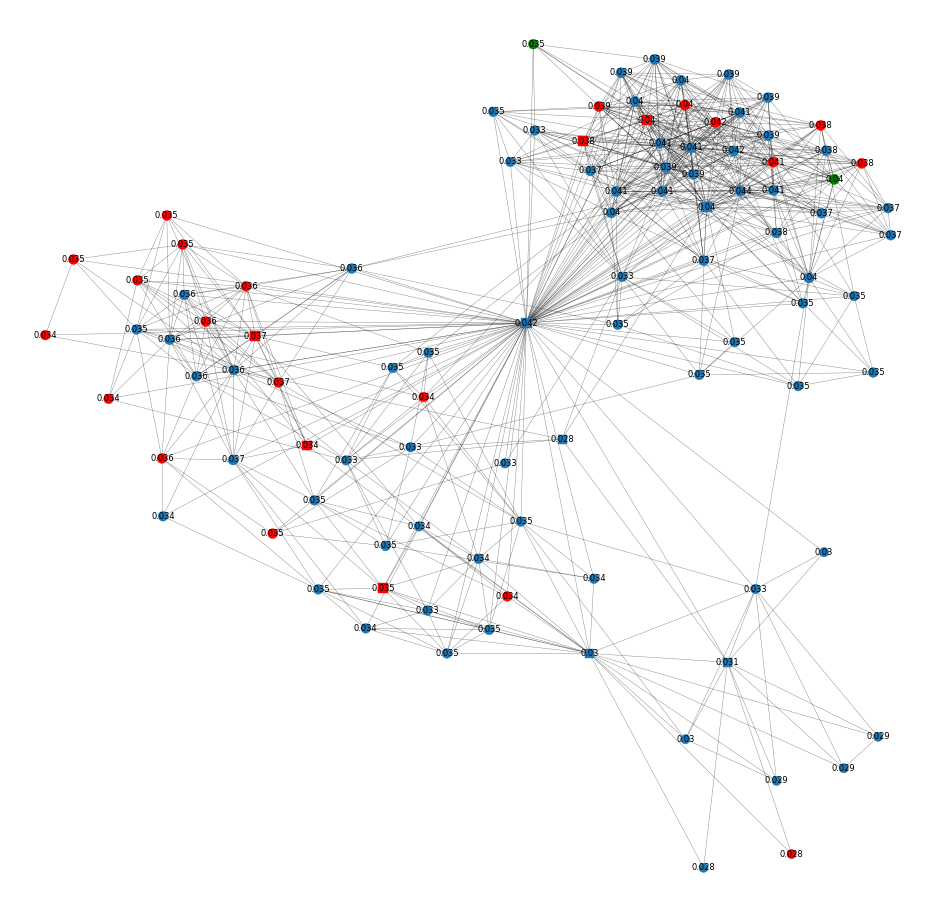

In [9]:
for sample in ['BFS_100_0.txt', 'DFS_100_0.txt', 'RW_100_0.txt', 'NS_100_0.txt', 'GG_100_0.txt', 'GF_100_0.txt']:
    print(sample, end = ' ')
    row, graph = my_evaluator.evaluate_sample(sample)
    draw(graph, my_evaluator)
    

In [10]:
df = pd.DataFrame()
for sample in my_evaluator.sample_list():
    row,_ = my_evaluator.evaluate_sample(sample)
    df = df.append(row, ignore_index=True)

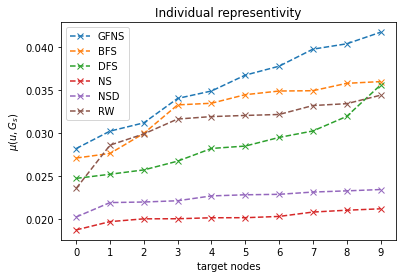

In [12]:
for sampler in [ 'GF', 'BFS', 'DFS', 'NS', 'NSD', 'RW']:
    idx = df[(df.sample_size== 100)& (df.sampler== sampler) ].index
    x = sorted(df.loc[idx,my_evaluator.target].values.mean(axis=0))
    #v = df.loc[idx,my_evaluator.target].values.std(axis=0)
    if sampler == 'GF':
        plt.plot(x, '--x', label = 'GFNS')
    else:
        plt.plot(x, '--x', label = sampler)
    #plt.fill_between(range(10), x-v,x+v, alpha=0.15)
plt.xlabel('target nodes')
plt.ylabel('$\mu(u,G_s)$')
plt.xticks(range(0,10))

plt.title('Individual representivity')

plt.legend()
plt.savefig('./figs/mu_curve.png')

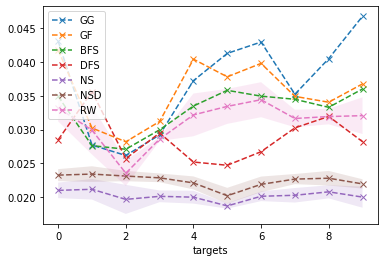

In [276]:
for sampler in ['GG', 'GF', 'BFS', 'DFS', 'NS', 'NSD', 'RW']:
    idx = df[(df.sample_size== 100)& (df.sampler== sampler) ].index
    x = df.loc[idx,my_evaluator.target].values.mean(axis=0)
    v = df.loc[idx,my_evaluator.target].values.std(axis=0)
    plt.plot(x, '--x', label = sampler)
    plt.fill_between(range(10), x-v,x+v, alpha=0.15)
plt.xlabel('targets')
plt.legend()

In [17]:
for size in [100, 200, 400]:
    for alg in df.sampler.unique():
        avg = np.round(df[(df['sampler']==alg) & (df['sample_size']==size) ].CC_L2.mean(),4)
        std = np.round(df[(df['sampler']==alg) & (df['sample_size']==size) ].CC_L2.std(),3)
        print(alg,'&', size, '&', avg ,'+/-', std)
    print()

DFS & 100 & 0.8665 +/- 0.0
BFS & 100 & 0.7228 +/- 0.0
NS & 100 & 0.8338 +/- 0.223
NSD & 100 & 0.7742 +/- 0.114
GF & 100 & 0.8411 +/- 0.0
RW & 100 & 0.5351 +/- 0.126
GG & 100 & 0.9126 +/- 0.0

DFS & 200 & 0.7517 +/- 0.0
BFS & 200 & 0.4809 +/- 0.0
NS & 200 & 0.6001 +/- 0.224
NSD & 200 & 0.6281 +/- 0.231
GF & 200 & 0.8835 +/- nan
RW & 200 & 0.3291 +/- 0.072
GG & 200 & 0.7408 +/- nan

DFS & 400 & 0.4541 +/- 0.0
BFS & 400 & 0.3221 +/- 0.0
NS & 400 & 0.3957 +/- 0.131
NSD & 400 & 0.2999 +/- 0.126
GF & 400 & 0.7502 +/- nan
RW & 400 & 0.231 +/- 0.016
GG & 400 & 0.3681 +/- nan



In [30]:
for alg in df.sampler.unique():
    for size in [100, 200, 400]:    
        avg = np.round(df[(df['sampler']==alg) & (df['sample_size']==size) ].pagerank_L2.mean(),3)
        std = np.round(df[(df['sampler']==alg) & (df['sample_size']==size) ].pagerank_L2.std(),3)
        if size == 100:
            print(alg, '&', avg ,'+/-', std, end = ' & ')
        elif size == 200:
            print(avg ,'+/-', std, end = ' & ')
        else:
            print(avg ,'+/-', std, end = ' \\\ ')
    print()


DFS & 0.079 +/- 0.0 & 0.056 +/- 0.0 & 0.043 +/- 0.0 \\ 
BFS & 0.067 +/- 0.0 & 0.045 +/- 0.0 & 0.032 +/- 0.0 \\ 
NS & 0.138 +/- 0.018 & 0.093 +/- 0.007 & 0.056 +/- 0.004 \\ 
NSD & 0.133 +/- 0.01 & 0.092 +/- 0.01 & 0.057 +/- 0.005 \\ 
GF & 0.066 +/- 0.0 & 0.032 +/- nan & 0.036 +/- nan \\ 
RW & 0.074 +/- 0.013 & 0.045 +/- 0.006 & 0.027 +/- 0.002 \\ 
GG & 0.046 +/- 0.0 & 0.025 +/- nan & 0.019 +/- nan \\ 


In [23]:
for alg in df.sampler.unique():
    for size in [100, 200, 400]:    
        avg = np.round(df[(df['sampler']==alg) & (df['sample_size']==size) ].total_sum.mean(),3)
        std = np.round(df[(df['sampler']==alg) & (df['sample_size']==size) ].total_sum.std(),3)
        if size == 100:
            print(alg, '&', avg ,'+/-', std, end = ' & ')
        elif size == 200:
            print(avg ,'+/-', std, end = ' & ')
        else:
            print(avg ,'+/-', std, end = ' \\\ ')
    print()

DFS & 0.286 +/- 0.0 & 0.561 +/- 0.0 & 1.102 +/- 0.0 \\ 
BFS & 0.328 +/- 0.0 & 0.632 +/- 0.0 & 1.206 +/- 0.0 \\ 
NS & 0.202 +/- 0.008 & 0.377 +/- 0.017 & 0.754 +/- 0.035 \\ 
NSD & 0.224 +/- 0.008 & 0.439 +/- 0.018 & 0.888 +/- 0.022 \\ 
GF & 0.355 +/- 0.0 & 0.647 +/- nan & 1.235 +/- nan \\ 
RW & 0.311 +/- 0.008 & 0.613 +/- 0.01 & 1.199 +/- 0.016 \\ 
GG & 0.37 +/- 0.0 & 0.707 +/- nan & 1.361 +/- nan \\ 


In [31]:
df

,58,107,353,428,566,1405,1505,1684,1835,1912,CC_L2,grp_0,grp_1,pagerank_L2,sample,sample_size,sampler,total_sum
0,0.029491,0.028488,0.026729,0.025203,0.024722,0.031943,0.030245,0.035602,0.028208,0.025709,0.8665,0.028369,0.028899,0.0793,DFS_100_2.txt,100.0,DFS,0.286341
1,0.056809,0.066449,0.068716,0.065317,0.068550,0.064370,0.065147,0.052647,0.070923,0.052800,0.4809,0.067541,0.058804,0.0453,BFS_200_0.txt,200.0,BFS,0.631727
2,0.036581,0.038397,0.035779,0.034823,0.033173,0.038224,0.037472,0.039716,0.036321,0.035016,0.4815,0.036194,0.036907,0.0978,NS_200_2.txt,200.0,NS,0.365501
3,0.038849,0.041822,0.038304,0.038767,0.036007,0.041016,0.040898,0.042067,0.042554,0.037596,0.3740,0.039756,0.039820,0.0917,NS_200_3.txt,200.0,NS,0.397880
4,0.056809,0.066449,0.068716,0.065317,0.068550,0.064370,0.065147,0.052647,0.070923,0.052800,0.4809,0.067541,0.058804,0.0453,BFS_200_1.txt,200.0,BFS,0.631727
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,0.114562,0.110019,0.101337,0.101199,0.094269,0.117143,0.114235,0.134598,0.103698,0.111129,0.4541,0.106136,0.114301,0.0429,DFS_400_3.txt,400.0,DFS,1.102189
85,0.087689,0.088343,0.085921,0.085778,0.080570,0.088872,0.087330,0.094773,0.083248,0.089308,0.5013,0.085188,0.089178,0.0507,NSD_400_4.txt,400.0,NSD,0.871834
86,0.031193,0.041749,0.039777,0.040402,0.037792,0.034037,0.034902,0.030228,0.036751,0.028197,0.8411,0.036652,0.034354,0.0660,GF_100_4.txt,100.0,GF,0.355028
87,0.114562,0.110019,0.101337,0.101199,0.094269,0.117143,0.114235,0.134598,0.103698,0.111129,0.4541,0.106136,0.114301,0.0429,DFS_400_2.txt,400.0,DFS,1.102189


In [17]:
abs_group = dict()
for alg in df.sampler.unique():
    abs_group[alg] = list()
    print(alg,end = ' & ' )
    for size in [100, 200, 400]:
        avg1 = np.round(df[(df['sampler']==alg) & (df['sample_size']==size) ].grp_0.mean(),4)
        std = np.round(df[(df['sampler']==alg) & (df['sample_size']==size) ].grp_0.std(),4)
        print( avg1 ,'+/-', std , end = ' & ')
        avg2 = np.round(df[(df['sampler']==alg) & (df['sample_size']==size) ].grp_1.mean(),4)
        std = np.round(df[(df['sampler']==alg) & (df['sample_size']==size) ].grp_1.std(),4)
        print( avg2 ,'+/-', std, end= ' & ')
        abs_group[alg].append((avg1, avg2)) 
    print()

DFS & 0.0284 +/- 0.0 & 0.0289 +/- 0.0 & 0.055 +/- 0.0 & 0.0572 +/- 0.0 & 0.1061 +/- 0.0 & 0.1143 +/- 0.0 & 
BFS & 0.0349 +/- 0.0 & 0.0306 +/- 0.0 & 0.0675 +/- 0.0 & 0.0588 +/- 0.0 & 0.1277 +/- 0.0 & 0.1136 +/- 0.0 & 
NS & 0.02 +/- 0.0009 & 0.0204 +/- 0.0009 & 0.0371 +/- 0.002 & 0.0384 +/- 0.0015 & 0.0738 +/- 0.0039 & 0.0771 +/- 0.0033 & 
NSD & 0.0219 +/- 0.001 & 0.023 +/- 0.0007 & 0.0428 +/- 0.0023 & 0.045 +/- 0.0013 & 0.0869 +/- 0.0027 & 0.0907 +/- 0.0018 & 
GF & 0.0367 +/- 0.0 & 0.0344 +/- 0.0 & 0.0647 +/- nan & 0.0647 +/- nan & 0.1235 +/- nan & 0.1235 +/- nan & 
RW & 0.0327 +/- 0.0013 & 0.0295 +/- 0.0006 & 0.0645 +/- 0.0018 & 0.0581 +/- 0.0005 & 0.1248 +/- 0.0027 & 0.1149 +/- 0.0011 & 
GG & 0.0413 +/- 0.0 & 0.0327 +/- 0.0 & 0.0788 +/- nan & 0.0627 +/- nan & 0.1514 +/- nan & 0.1209 +/- nan & 


In [1]:
min(float("inf"),10)

10

In [104]:
ax[1]

<AxesSubplot:>

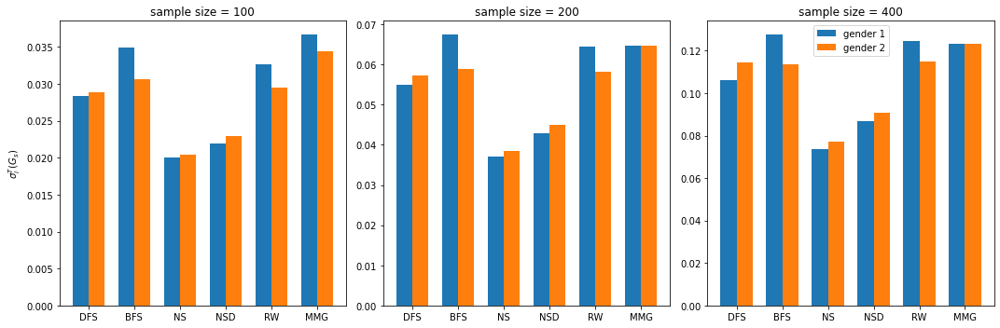

In [18]:
algs = ['DFS', 'BFS', 'NS', 'NSD', 'RW', 'GF']
algs1 = ['DFS', 'BFS', 'NS', 'NSD', 'RW', 'MMG']
m = len(algs)+1
ind = np.arange(1,m)     
width = 0.025 
sizes = [100,200,400]
fig, ax = plt.subplots(1, 3,figsize=(15, 5))#, sharex=True, sharey=True)#, , sharex=True) 
fig.subplots_adjust(bottom=0.2) #make room for the legend 
plt.setp(ax, xticks= ind/m, xticklabels=algs1)

for i in range(3):
    grp1 = list()
    grp2 = list()
    for alg in algs:
        grp1.append(abs_group[alg][i][0])
        grp2.append(abs_group[alg][i][1])
    ax[i].bar(ind/m-width, grp1, width = 2*width , label = 'gender 1')
    ax[i].bar(ind/m+width, grp2, width = 2*width ,  label = 'gender 2')

    ax[i].set_title('sample size = '+str(sizes[i]))
# plt.xticks(ind/m, algs, rotation='vertical') 
# plt.xticks(ind/m, algs, rotation='vertical') 
#plt.yticks(np.arange(0,18,2)) 
ax[0].set_ylabel('$\sigma_i^T(G_s)$')
plt.legend()
fig.tight_layout()
plt.savefig('./figs/fairness_facebook.png')

In [130]:
my_evaluator.users.gender.value_counts()/my_evaluator.users.shape[0]

 1    0.599901
 0    0.379302
-1    0.020797
Name: gender, dtype: float64


## general Performance

In [3]:
general_performance = pd.DataFrame()
path = './evaluations/Facebook_'
for size in [100, 200, 400, 800, 1600, 3200]:
    df = pd.read_csv(path + str(size) +'.csv', header = None)
    df_g = pd.read_csv(path + str(size) +'_gender.csv', header= None)
    for sample in df_g[0].unique():
        for centrality in df_g[df_g[0] ==sample][2].unique():
            row = {'sample': sample , 'centrality':centrality , 'sampler': sample.split('_')[0],'size': size }
            row.update(mean_value(sample, centrality))
            general_performance = general_performance.append(row, ignore_index=True)

In [6]:
general_mean = dict()
general_var = dict()
for centrality in general_performance.centrality.unique():
    general_mean[centrality] = dict()
    general_var[centrality] = dict()
    for sampler in general_performance.sampler.unique():
        general_mean[centrality][sampler] = list()
        general_var[centrality][sampler] = list()
        for size in sorted(general_performance['size'].unique()):
            general_mean[centrality][sampler].append(general_performance.loc[(general_performance['centrality'] == centrality)&(general_performance['sampler'] == sampler) & (general_performance['size'] == size ), 'mean'].mean())
            general_var[centrality][sampler].append(general_performance.loc[(general_performance['centrality'] == centrality)&(general_performance['sampler'] == sampler) & (general_performance['size'] == size ), 'mean'].var())

In [8]:
general_mean[centrality].keys()

dict_keys(['DFS', 'NS', 'NSD', 'BFS', 'RW', 'MHRW', 'MHH', 'MHHBFS'])

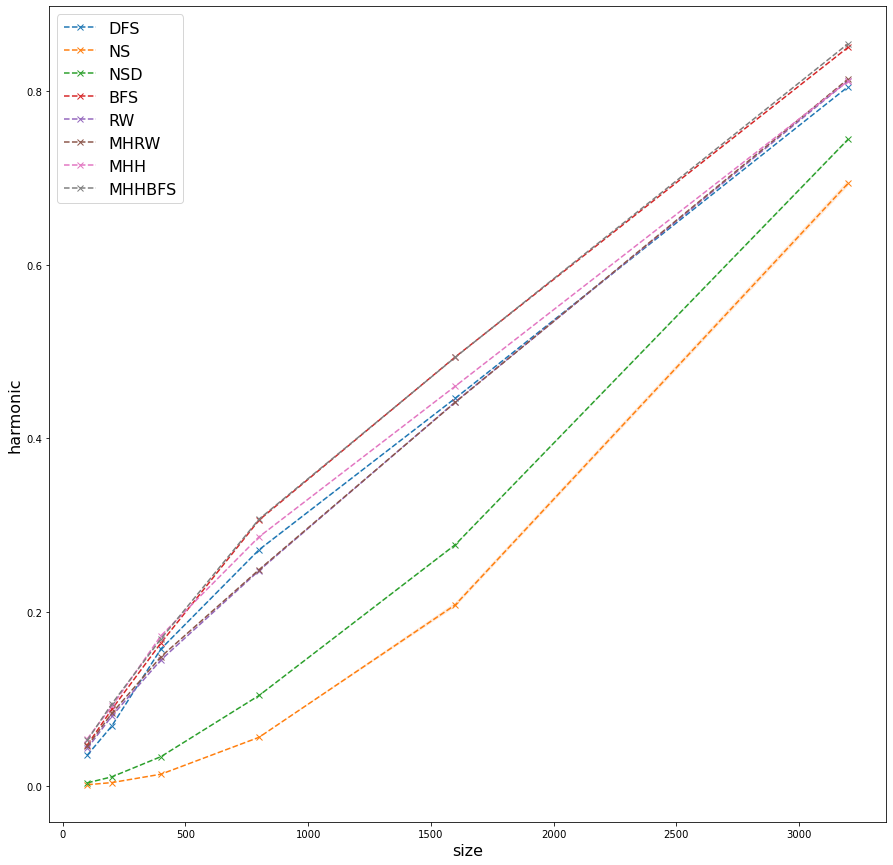

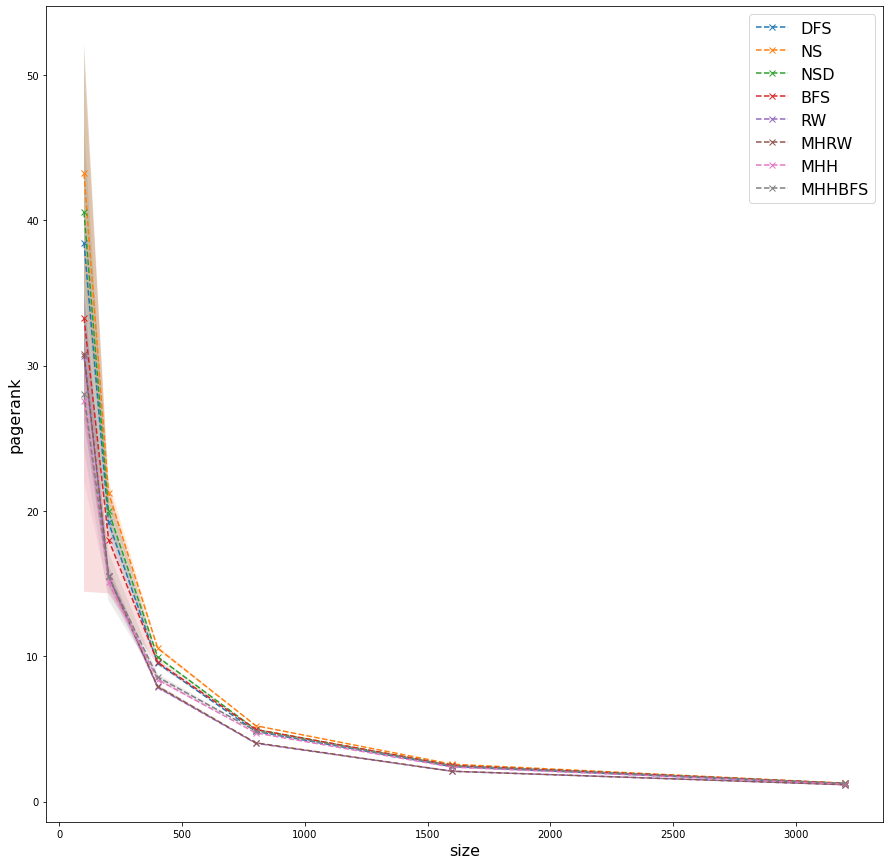

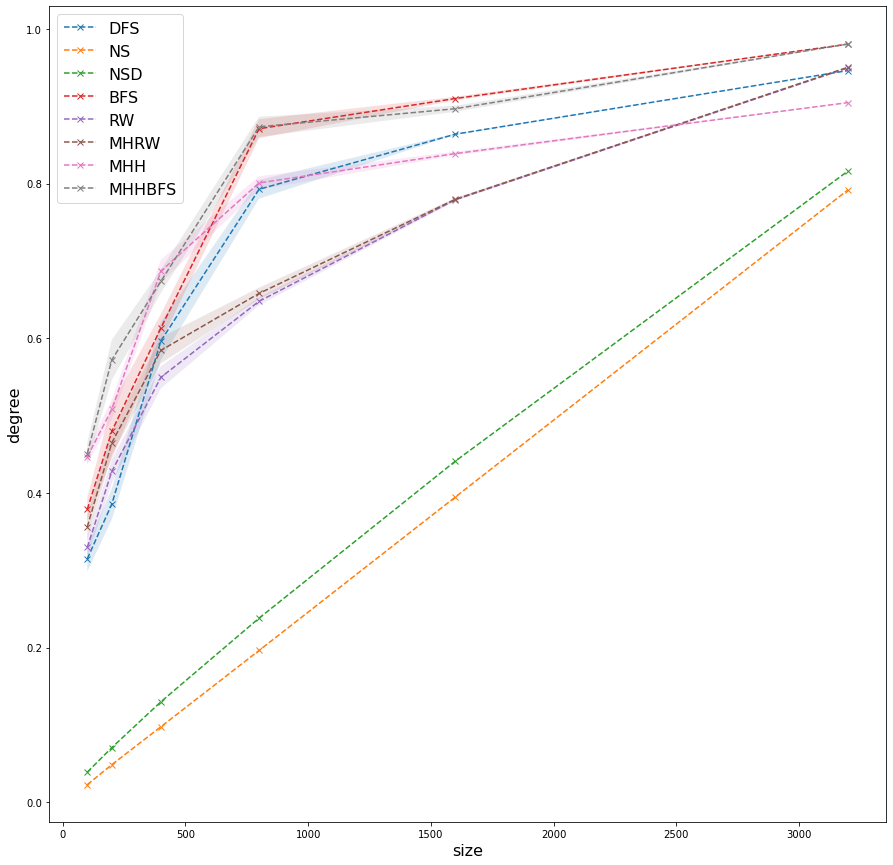

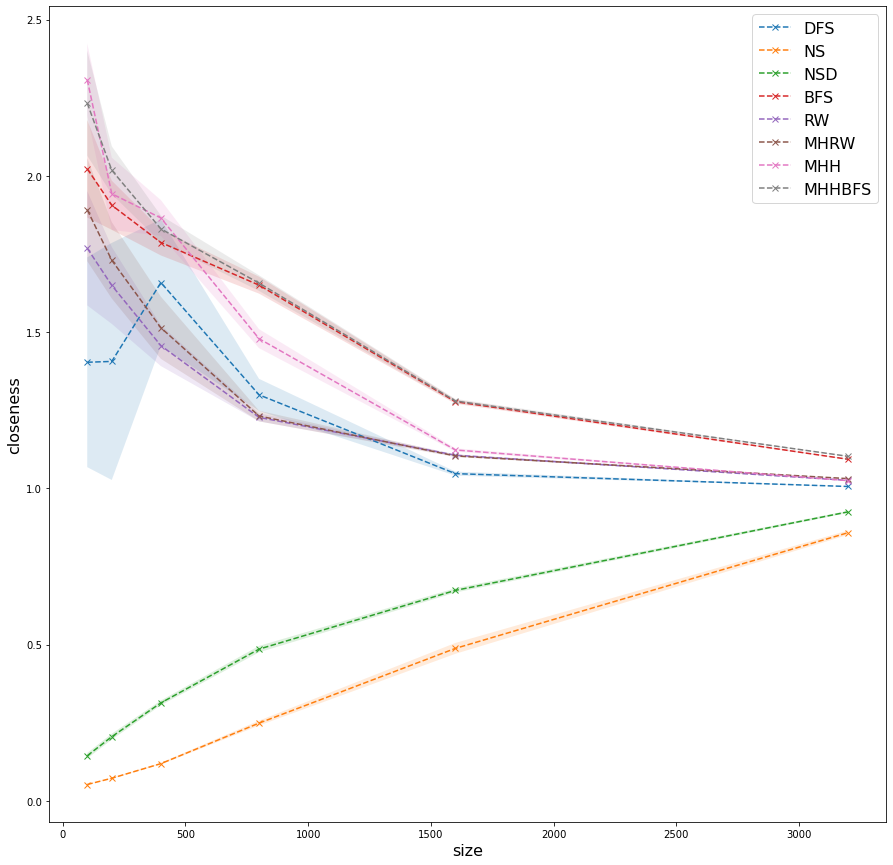

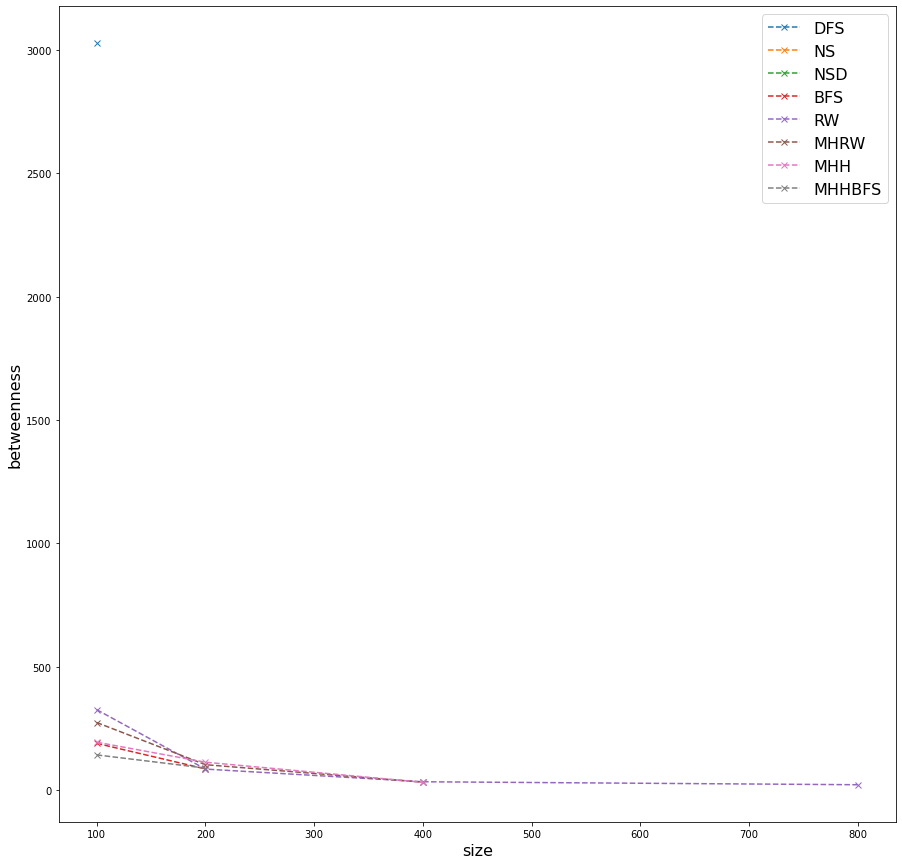

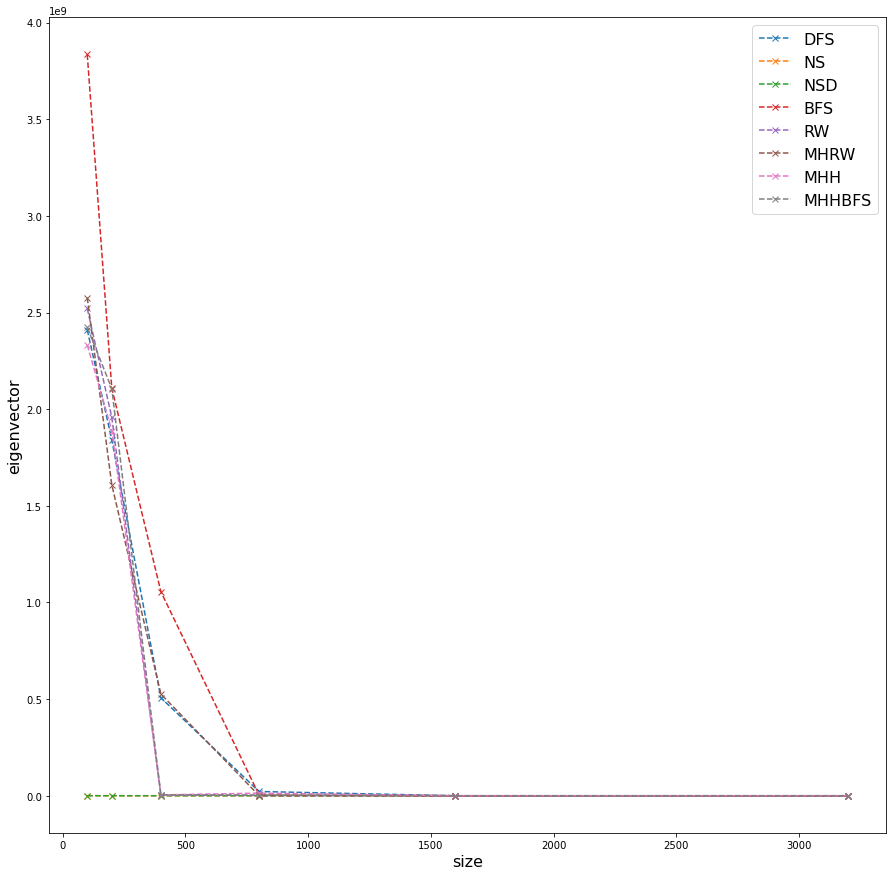

In [9]:
for centrality in ['harmonic',  'pagerank', 'degree','closeness','betweenness', 'eigenvector' ]:
    sizes = [100, 200, 400, 800, 1600, 3200]
    plt.figure(num=None, figsize=(15, 15))
    for sampler in general_mean[centrality].keys():
        m = np.array(general_mean[centrality][sampler])
        v = np.array(general_var[centrality][sampler])
        plt.plot(sizes,m,'--x' ,label = sampler)
        if centrality == 'betweenness' or centrality == 'eigenvector':
            pass
        else:
            plt.fill_between(sizes, m-v,m+v, alpha=0.15)
    plt.ylabel(centrality, fontsize =16)
    plt.legend(fontsize =16)
    plt.xlabel('size',fontsize =16 )
    plt.show()    

## Group Fairness

In [10]:
group_fairness = pd.DataFrame()
path = './evaluations/Facebook_'
for size in [100, 200, 400, 800, 1600, 3200]:
    df = pd.read_csv(path + str(size) +'.csv', header = None)
    df_g = pd.read_csv(path + str(size) +'_gender.csv', header= None)
    for sample in df_g[0].unique():
        for centrality in df_g[df_g[0] ==sample][2].unique():
            row = {'sample': sample , 'centrality':centrality , 'sampler': sample.split('_')[0],'size': size }
            row.update(group_centerality(sample, centrality))
            group_fairness = group_fairness.append(row, ignore_index=True)
group_fairness['gap'] = (group_fairness[1] - group_fairness[0])

In [14]:
group_gap_mean.keys()

dict_keys(['eigenvector', 'closeness', 'information', 'pagerank', 'betweenness', 'harmonic', 'degree'])

In [11]:
group_gap_mean = dict()
group_gap_var = dict()
for centrality in group_fairness.centrality.unique():
    group_gap_mean[centrality] = dict()
    group_gap_var[centrality] = dict()
    for sampler in group_fairness.sampler.unique():
        group_gap_mean[centrality][sampler] = list()
        group_gap_var[centrality][sampler] = list()
        for size in sorted(group_fairness['size'].unique()):
            group_gap_mean[centrality][sampler].append(group_fairness.loc[(group_fairness['centrality'] == centrality)&(group_fairness['sampler'] == sampler) & (group_fairness['size'] == size ), 'gap'].mean())
            group_gap_var[centrality][sampler].append(group_fairness.loc[(group_fairness['centrality'] == centrality)&(group_fairness['sampler'] == sampler) & (group_fairness['size'] == size ), 'gap'].var())

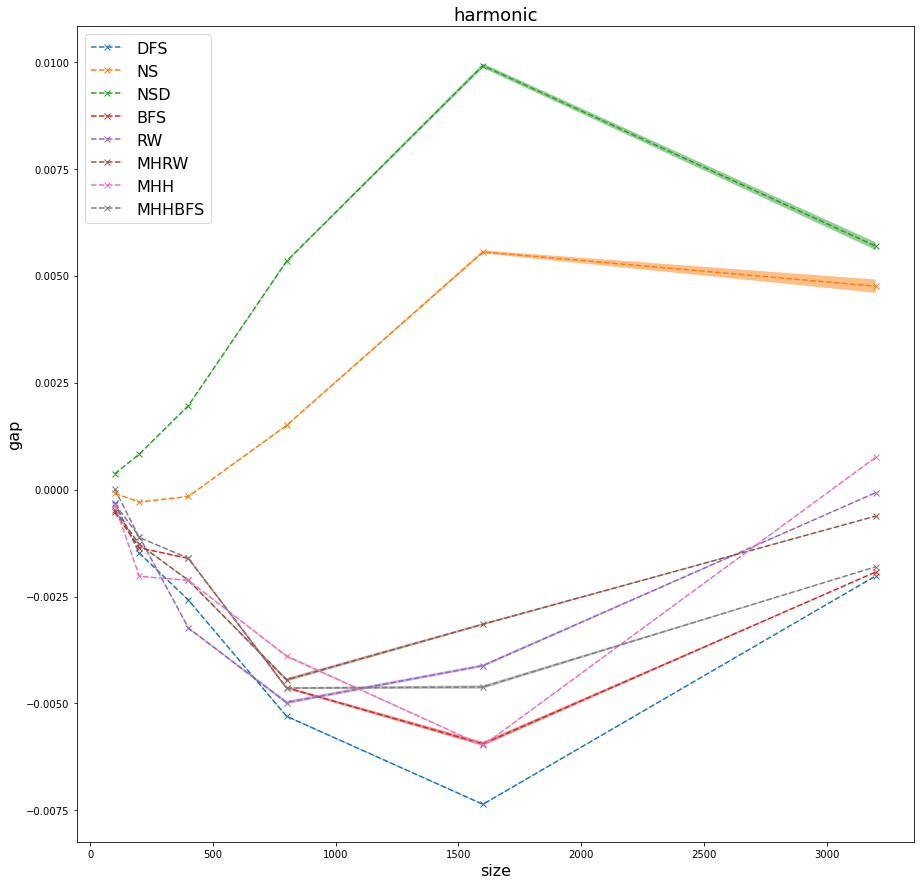

In [15]:
centrality = 'harmonic'
sizes = [100, 200, 400, 800, 1600, 3200]
plt.figure(num=None, figsize=(15, 15))
for sampler in group_gap_mean[centrality].keys():
    m = np.array(group_gap_mean[centrality][sampler])
    v = np.array(group_gap_var[centrality][sampler])
    plt.plot(sizes,m,'--x' ,label = sampler)
    plt.fill_between(sizes, m-v,m+v, alpha=0.5)
plt.title(centrality,fontsize =18)
plt.ylabel('gap', fontsize =16)
plt.legend(fontsize =16)
plt.xlabel('size',fontsize =16 )
plt.show()    

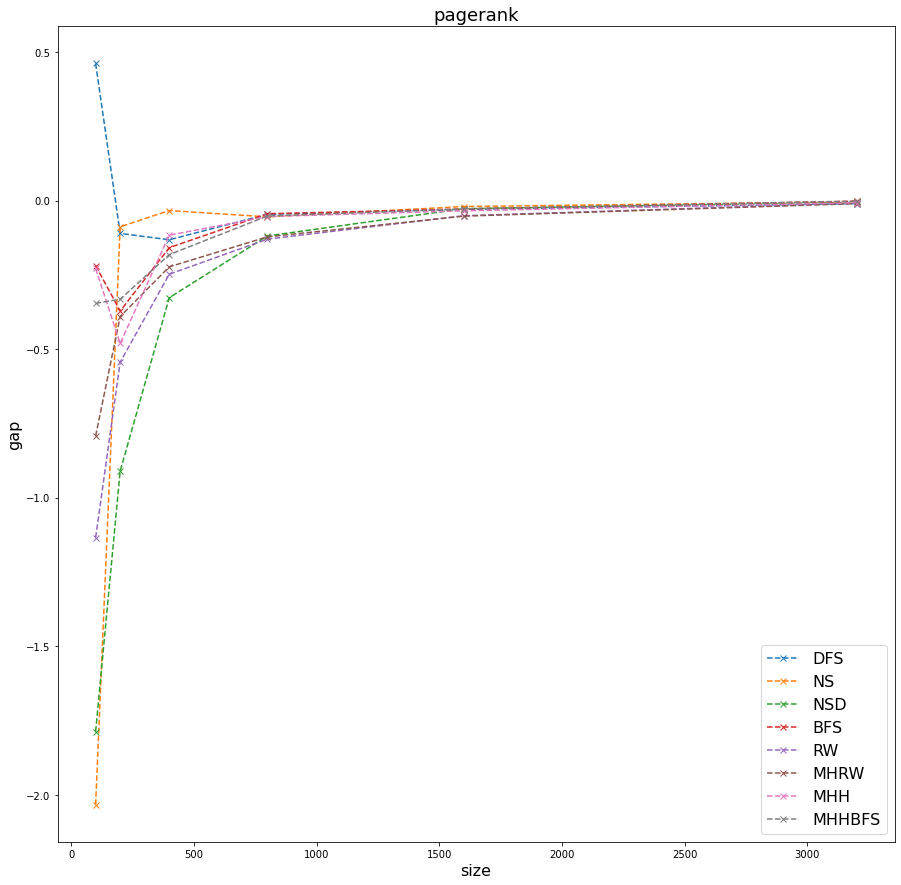

In [16]:
centrality = 'pagerank'
sizes = [100, 200, 400, 800, 1600, 3200]
plt.figure(num=None, figsize=(15, 15))
for sampler in group_gap_mean[centrality].keys():
    m = np.array(group_gap_mean[centrality][sampler])
    v = np.array(group_gap_var[centrality][sampler])
    plt.plot(sizes,m,'--x' ,label = sampler)
    #plt.fill_between(sizes, m-v,m+v, alpha=0.25)
plt.title(centrality,fontsize =18)
plt.ylabel('gap', fontsize =16)
plt.legend(fontsize =16)
plt.xlabel('size',fontsize =16 )
plt.show() 

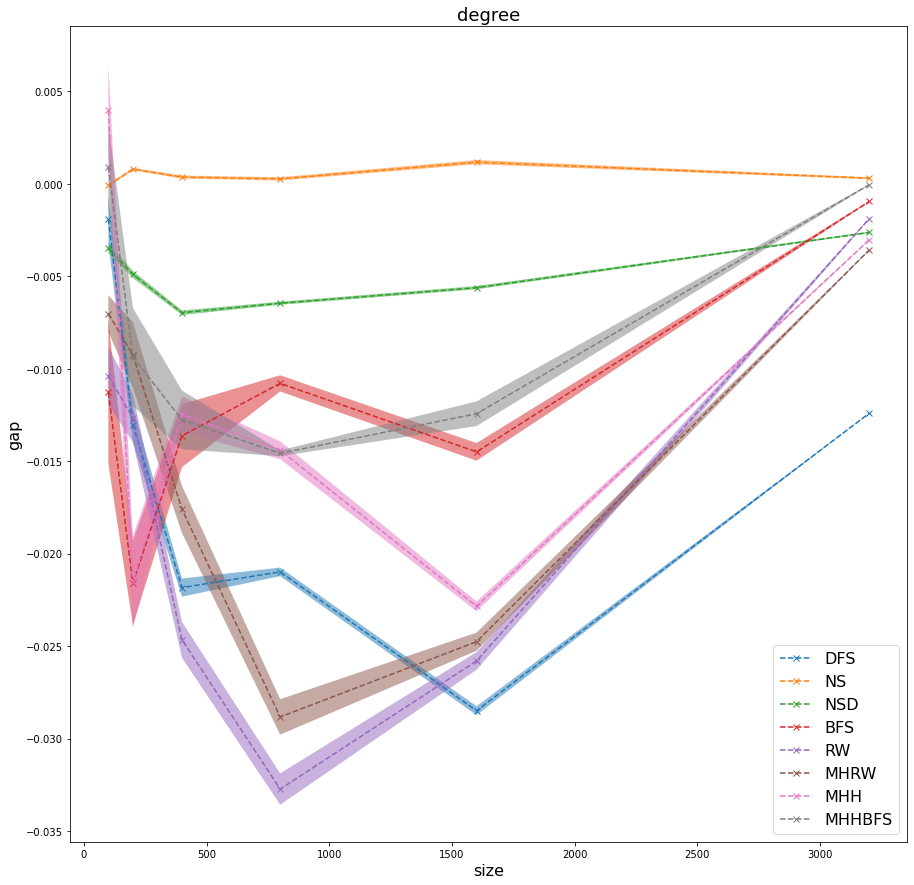

In [17]:
centrality = 'degree'
sizes = [100, 200, 400, 800, 1600, 3200]
plt.figure(num=None, figsize=(15, 15))
for sampler in group_gap_mean[centrality].keys():
    m = np.array(group_gap_mean[centrality][sampler])
    v = np.array(group_gap_var[centrality][sampler])
    plt.plot(sizes,m,'--x' ,label = sampler)
    plt.fill_between(sizes, m-v,m+v, alpha=0.5)
plt.title(centrality,fontsize =18)
plt.ylabel('gap', fontsize =16)
plt.legend(fontsize =16)
plt.xlabel('size',fontsize =16 )
plt.show() 

## Individual Level 

In [19]:
ordered_average = dict()
ordered_var = dict()
path = './evaluations/Facebook_'
for size in [100, 200, 400, 800, 1600, 3200]:
    ordered_average[size] = dict()
    ordered_var[size] = dict()
    df = pd.read_csv(path + str(size) +'.csv', header = None)
    for sampler in df_g[1].unique():
        ordered_average[size][sampler] = dict()
        ordered_var[size][sampler] = dict()
        for centrality in df[df[1] ==sampler][2].unique():
            data = oredered_avg(sampler, centrality)
            ordered_average[size][sampler][centrality] =  data.mean().to_numpy()
            ordered_var[size][sampler][centrality] =  data.var().to_numpy()

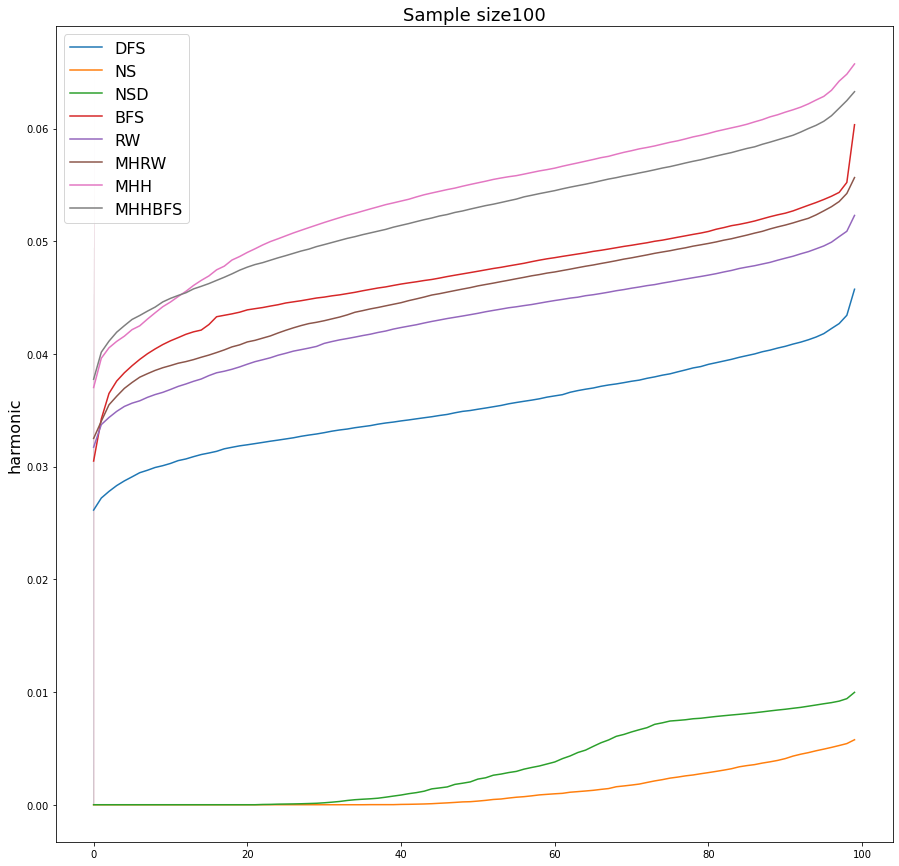

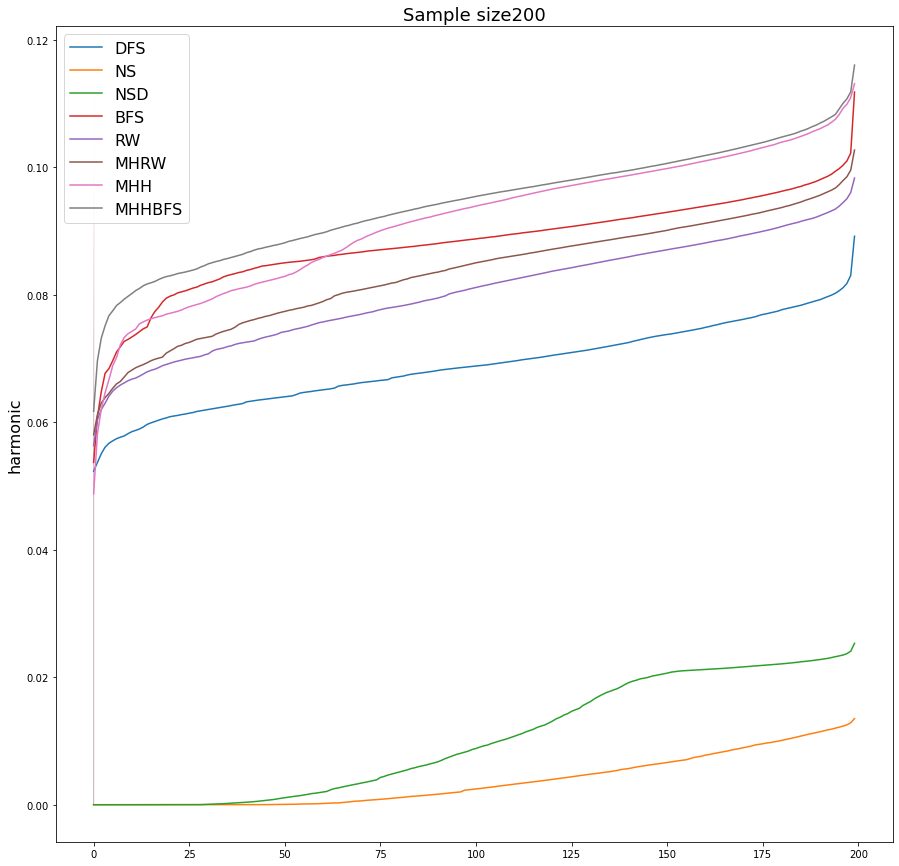

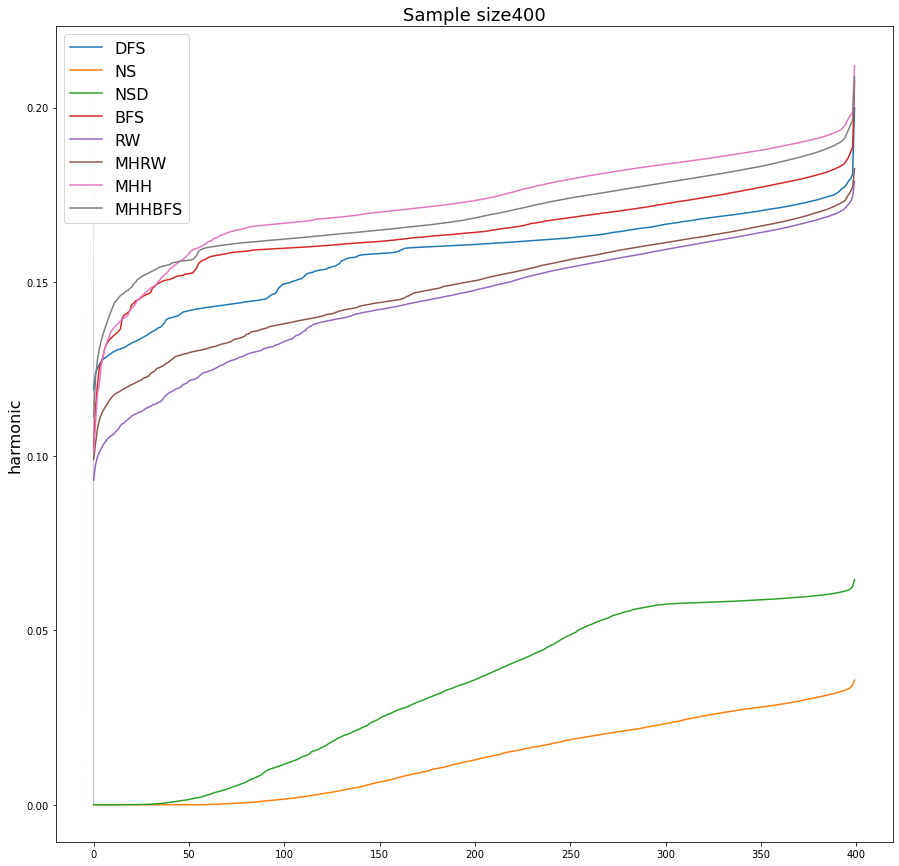

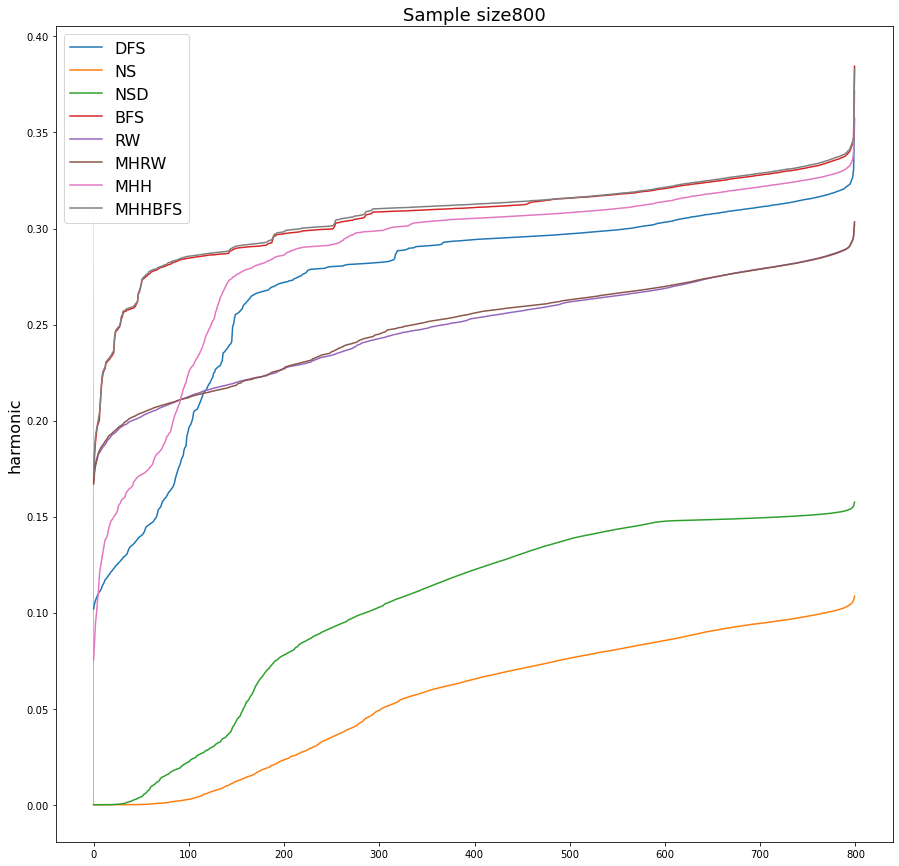

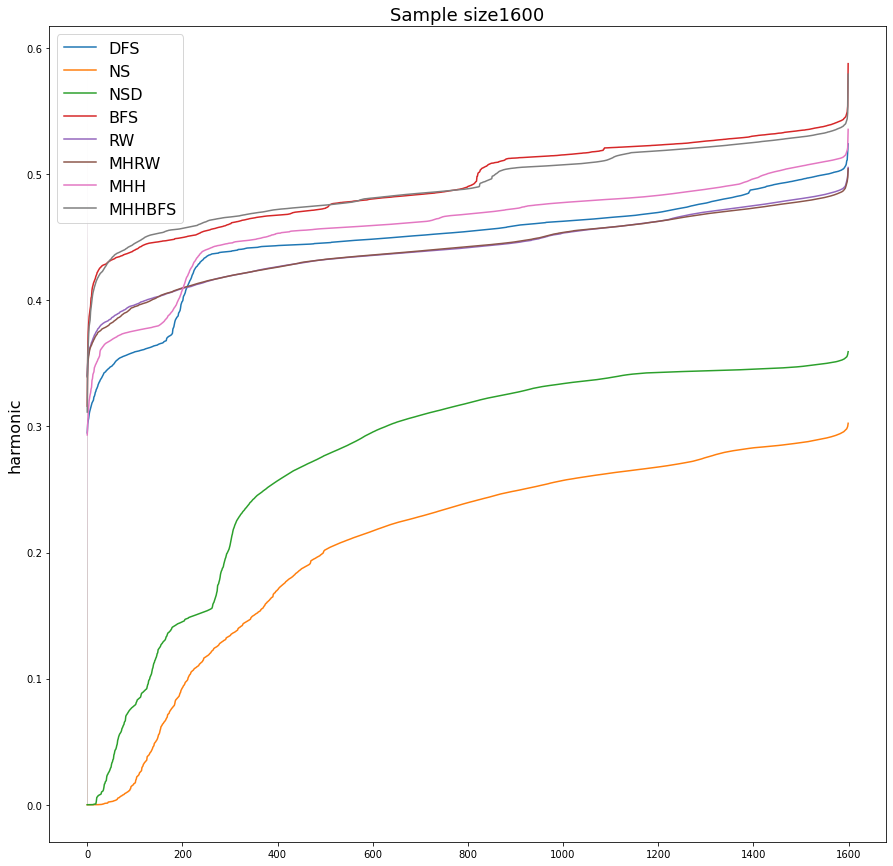

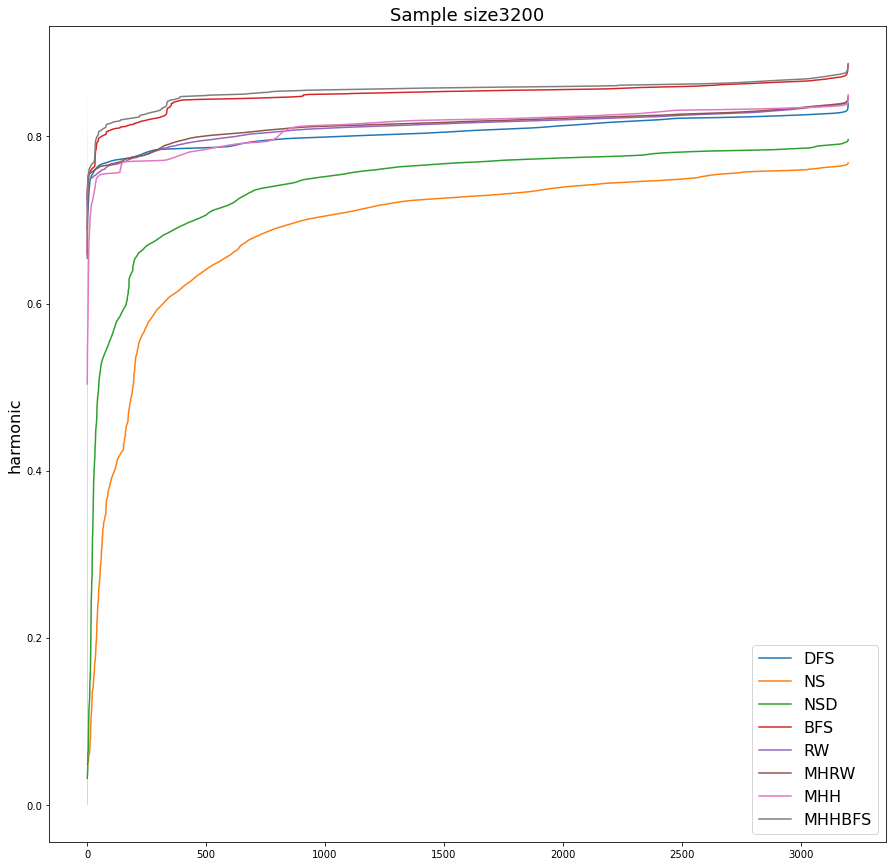

In [20]:
centrality = 'harmonic'
for size in [100, 200, 400, 800, 1600, 3200]:
    plt.figure(num=None, figsize=(15, 15))
    for sampler in group_fairness.sampler.unique():
        x = ordered_average[size][sampler][centrality]
        y = ordered_var[size][sampler][centrality]
        plt.plot(x, label = sampler)
        plt.fill_between( x-y,x+y, alpha=0.5)
    plt.legend(fontsize= 16)
    plt.title('Sample size'+ str(size),fontsize= 18)
    plt.ylabel(centrality, fontsize= 16)
    plt.show()

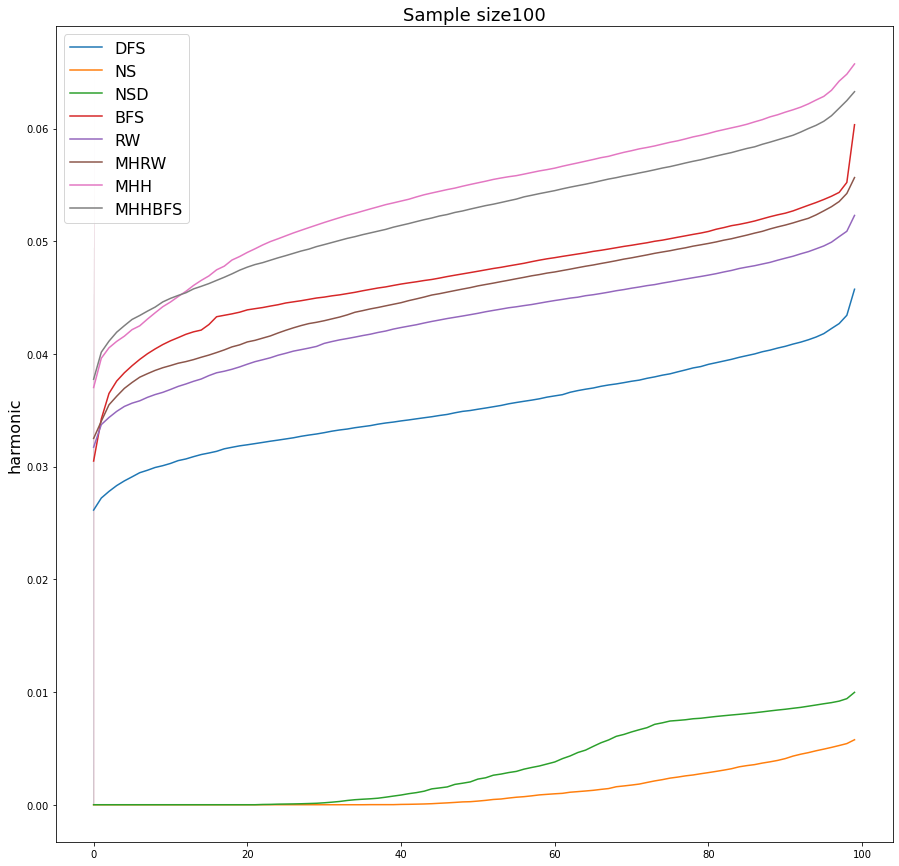

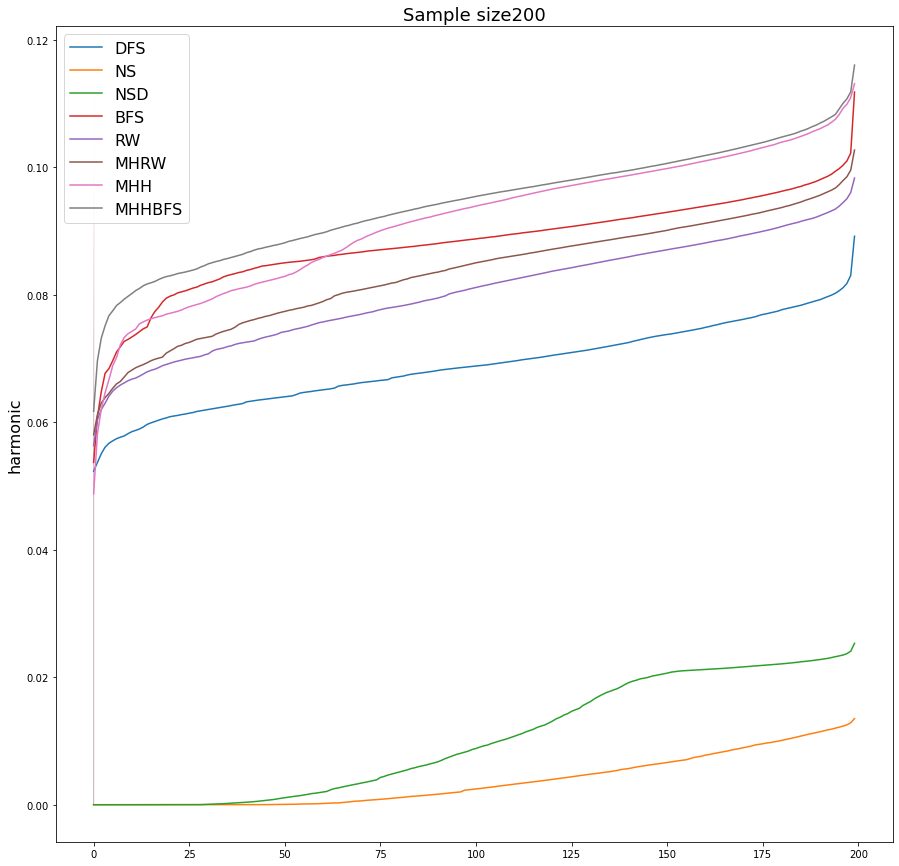

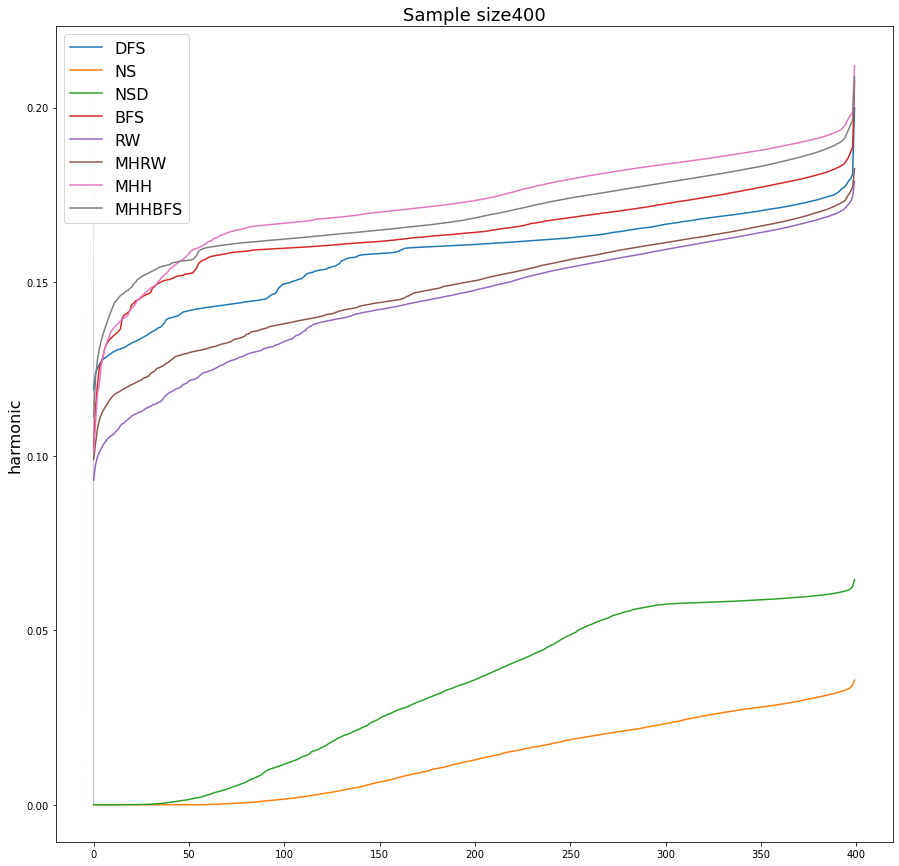

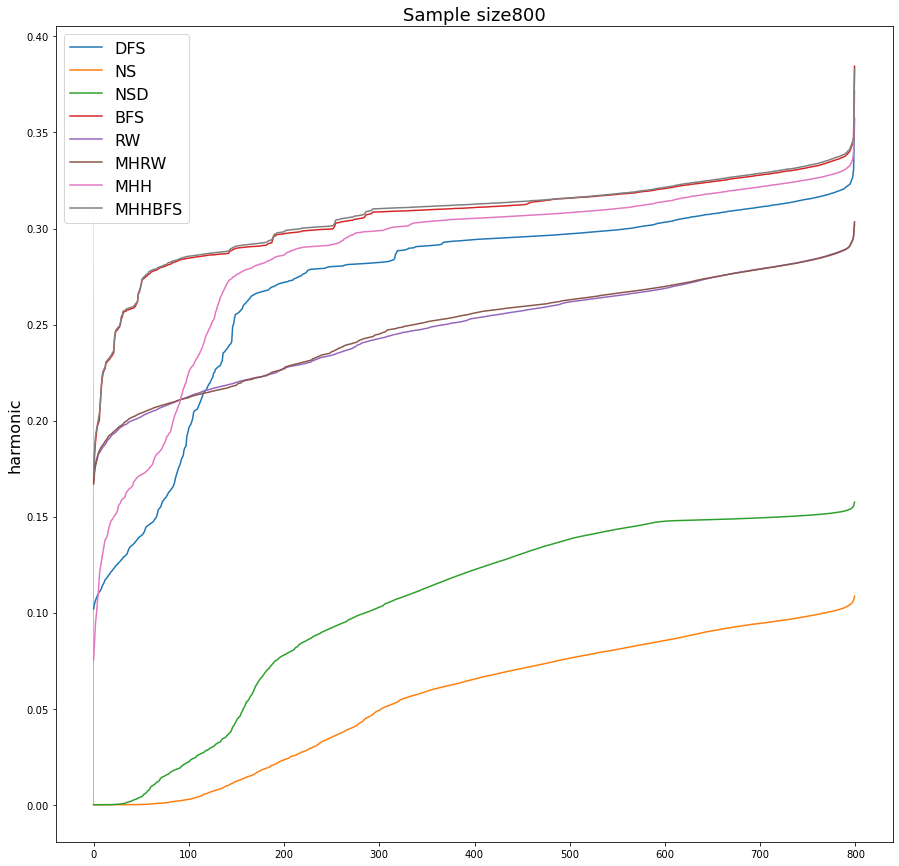

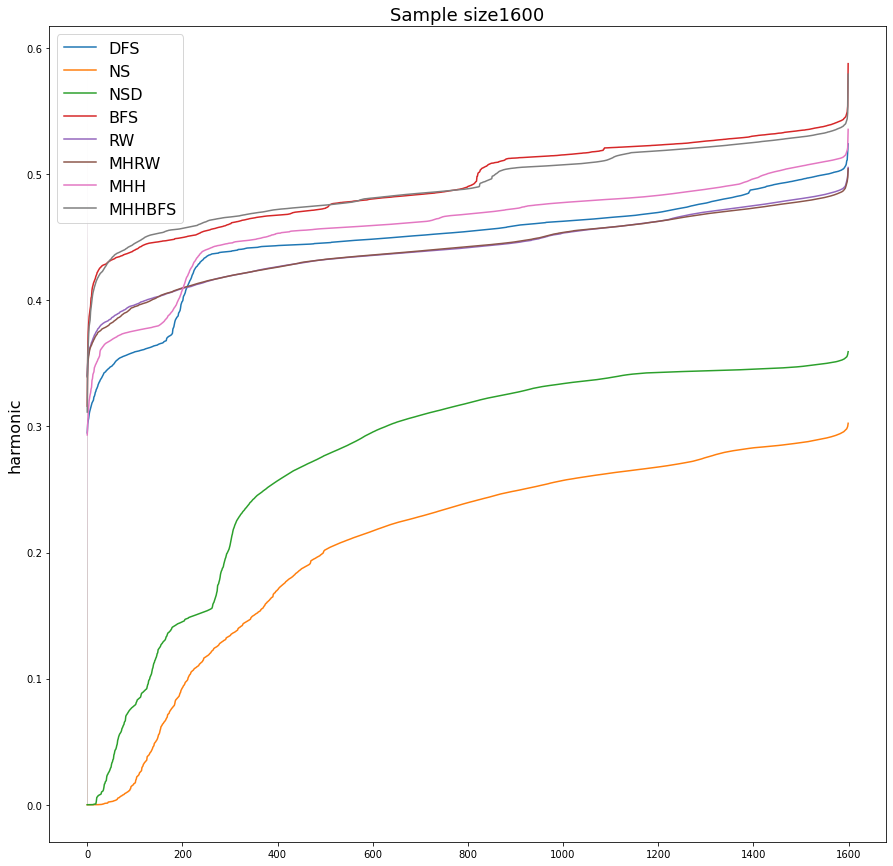

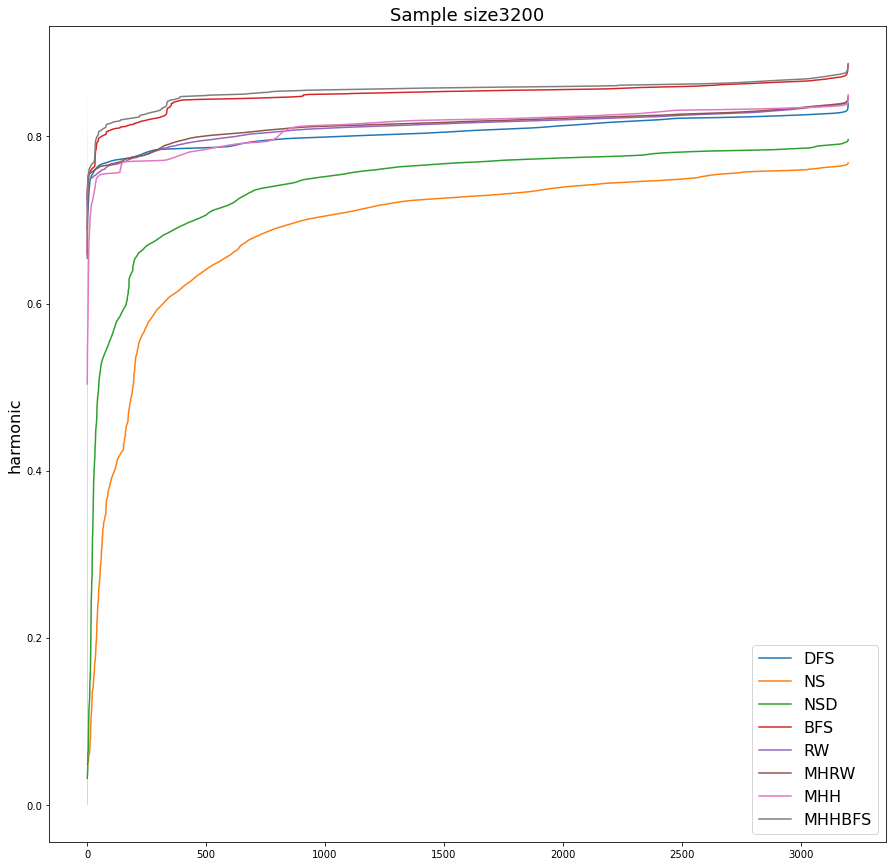

In [21]:
centrality = 'harmonic'
for size in [100, 200, 400, 800, 1600, 3200]:
    plt.figure(num=None, figsize=(15, 15))
    for sampler in group_fairness.sampler.unique():
        x = ordered_average[size][sampler][centrality]
        y = ordered_var[size][sampler][centrality]
        plt.plot(x, label = sampler)
        plt.fill_between( x-y,x+y, alpha=0.5)
    plt.legend(fontsize= 16)
    plt.title('Sample size'+ str(size),fontsize= 18)
    plt.ylabel(centrality, fontsize= 16)
    plt.show()

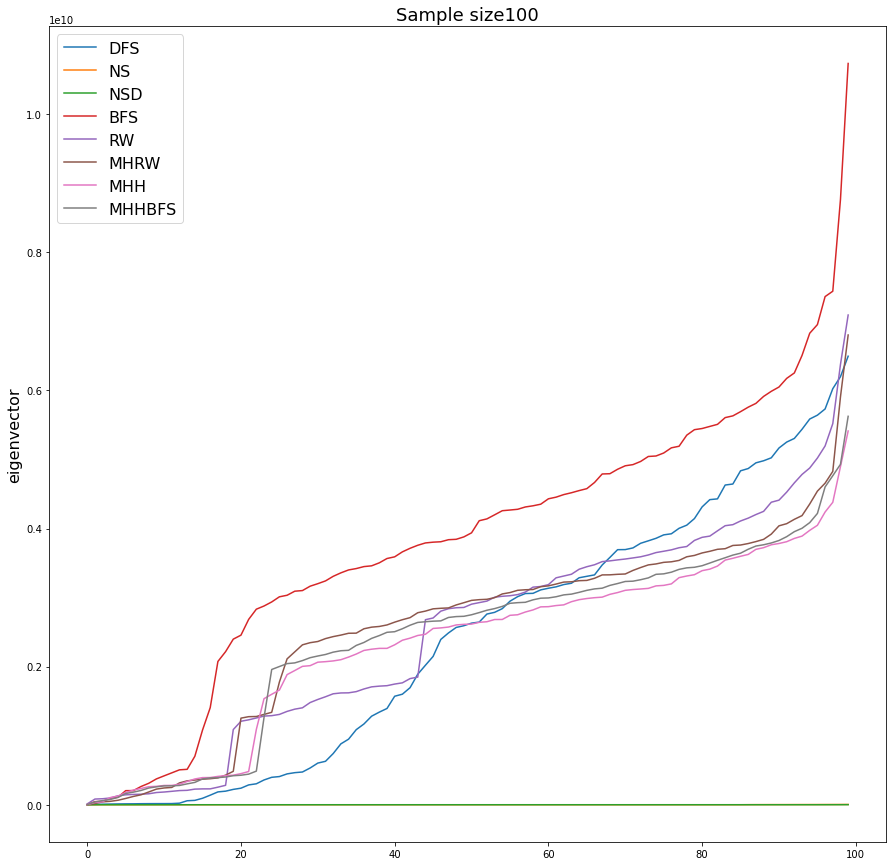

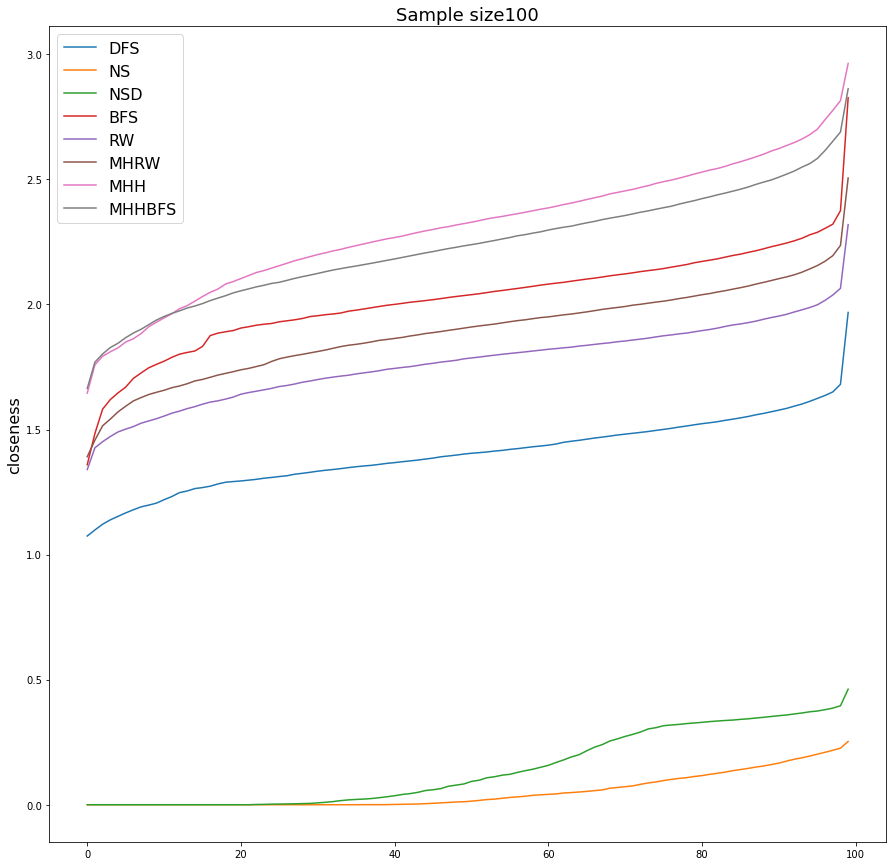

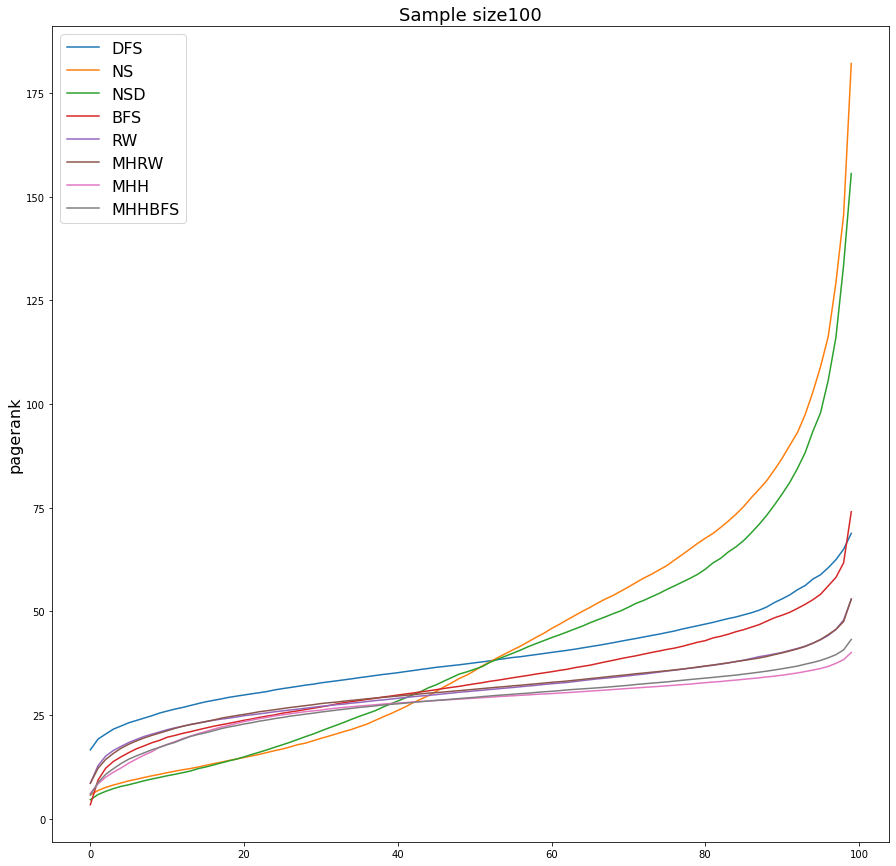

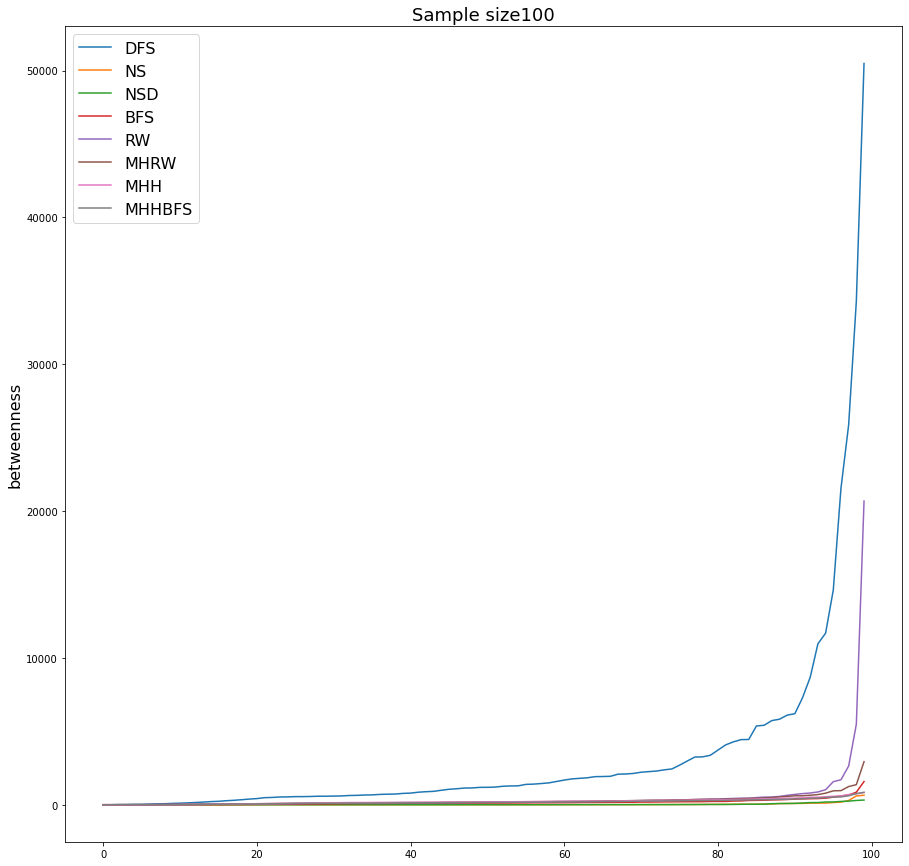

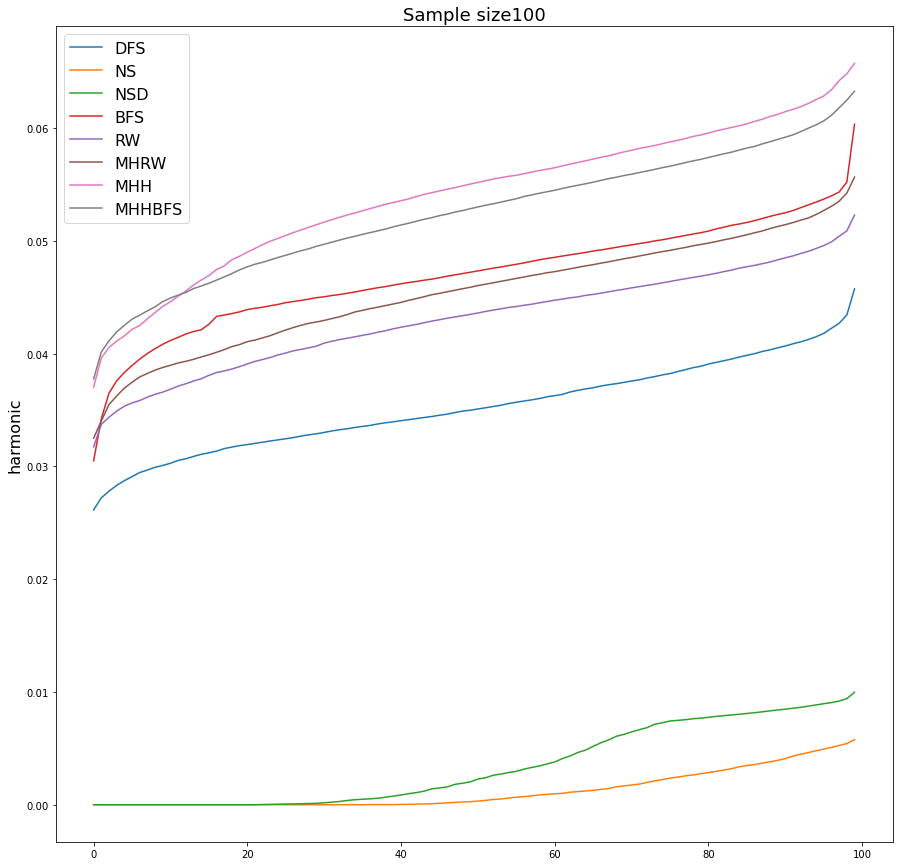

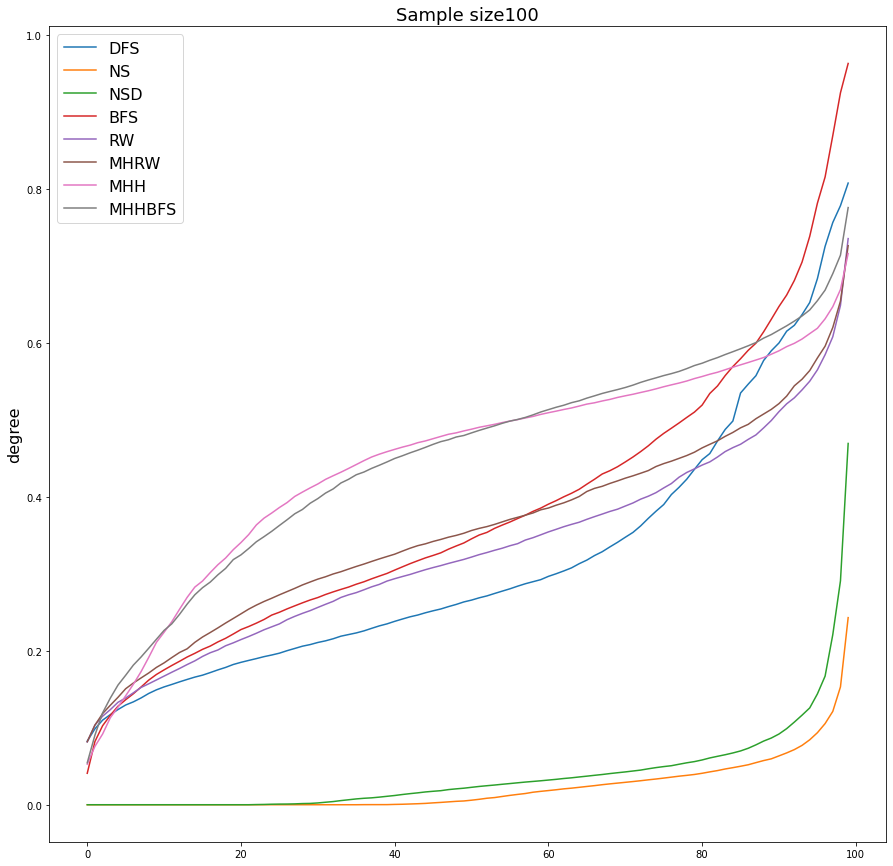

In [22]:
size = 100
for centrality in ['eigenvector', 'closeness', 'pagerank', 'betweenness', 'harmonic', 'degree']:
    plt.figure(num=None, figsize=(15, 15))
    for sampler in group_fairness.sampler.unique():
        x = ordered_average[size][sampler][centrality]
        plt.plot(sorted(x), label = sampler)
        #plt.fill_between( x-y,x+y, alpha=0.5)
    plt.legend(fontsize= 16)
    plt.title('Sample size'+ str(size),fontsize= 18)
    plt.ylabel(centrality, fontsize= 16)
    plt.show()

In [23]:
from evaluator_nx import Evaluator_nx
import networkx as nx
import matplotlib.pyplot as plt
class Args:
    def __init__(self):
        self.path = './data/Facebook/'
        self.sample_path = './samples/'


args = Args()       
my_evaluator = Evaluator_nx(args, print_ = False)
samples = [sample for sample in my_evaluator.sample_list() if valid(sample)]
my_evaluator.cents.head()

,degree,eigenvector,pagerank,closeness,information,betweenness,harmonic
0,347,3.391796e-05,0.006290,0.353343,0.001413,1.463059e-01,1689.983333
1,17,6.045346e-07,0.000236,0.261376,0.001046,2.783274e-06,1151.419048
2,10,2.233461e-07,0.000203,0.261258,0.000818,7.595021e-08,1147.919048
3,17,6.635648e-07,0.000226,0.261376,0.001047,1.685066e-06,1151.419048
4,10,2.236416e-07,0.000238,0.261258,0.000708,1.840332e-07,1147.919048


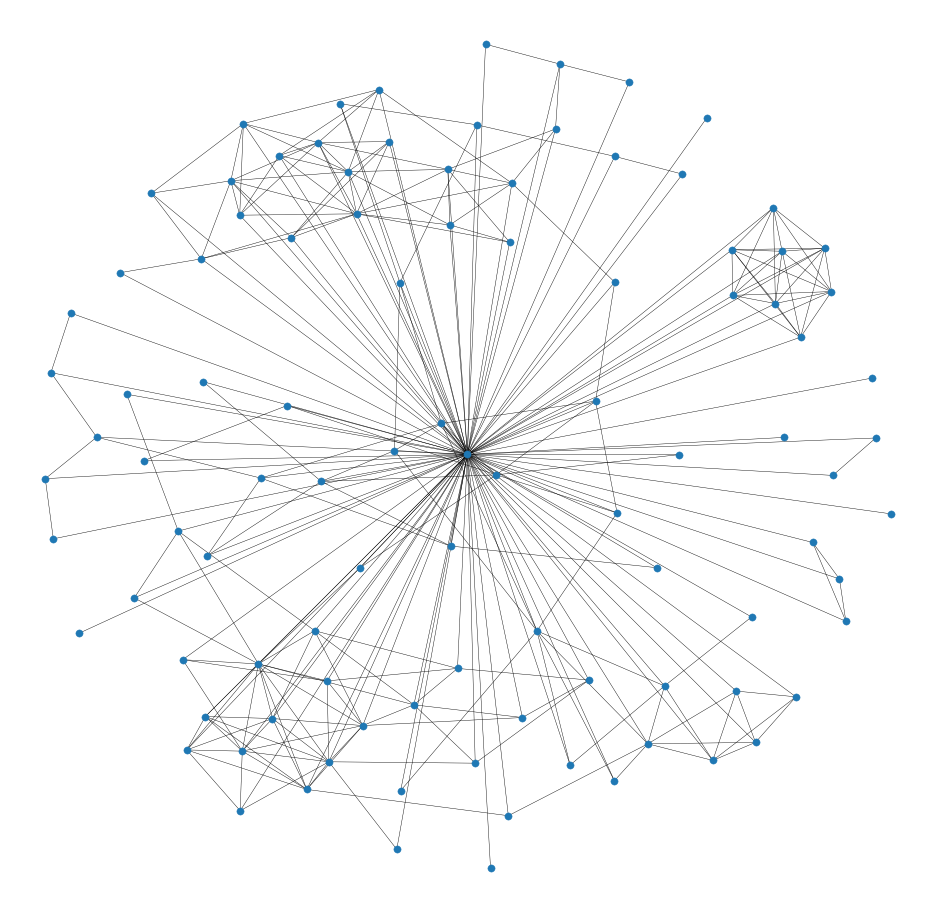

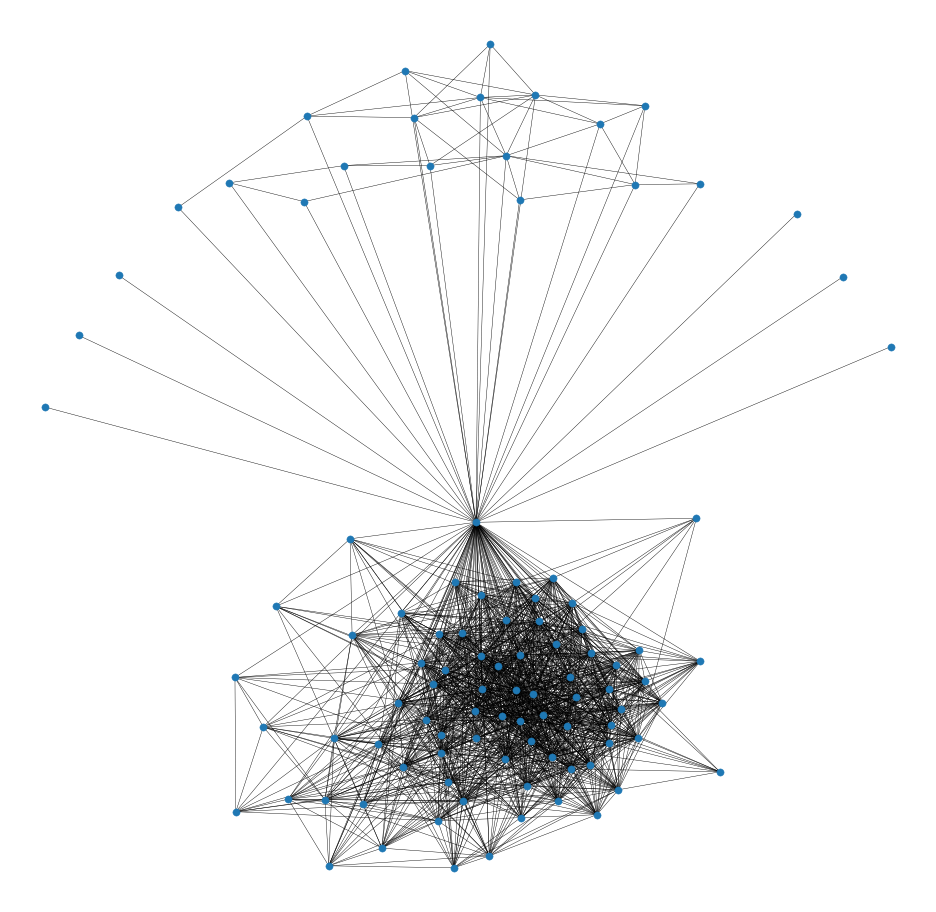

,eigenvector,closeness,information,pagerank,betweenness,harmonic,degree
58,0.065667,0.507692,0.013720,0.005609,0.000000,51.0,3
107,0.158456,0.540984,0.022081,0.021664,0.005214,57.0,15
171,0.076765,0.512953,0.016329,0.008868,0.000378,52.0,5
1684,0.598246,1.000000,0.027535,0.159995,0.921958,99.0,99
990,0.127929,0.526596,0.020239,0.014390,0.000861,54.5,10


In [45]:
sample = 'BFS_100_0.txt'
cents, graph = my_evaluator.evaluate_sample(sample, to_results = False)
sample = 'MHHBFS_100_0.txt'
cents_h, graph_h = my_evaluator.evaluate_sample(sample, to_results = False)

draw(graph)
draw(graph_h)
cents.head()

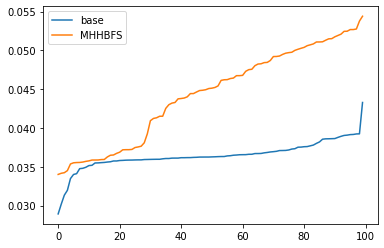

In [28]:
col = 'harmonic'
nodes = list(graph.nodes())
x = np.array(cents[col].loc[nodes]/my_evaluator.cents[col].loc[nodes].values)
plt.plot(sorted(x), label ='base')

nodes_h = list(graph_h.nodes())
x = np.array(cents_h[col].loc[nodes_h]/my_evaluator.cents[col].loc[nodes_h].values)
plt.plot(sorted(x), label ='MHHBFS')
plt.legend()


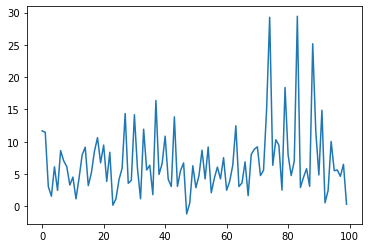

In [37]:
plt.plot(np.array(harmonics_avg_mhh)- np.array(harmonics_avg_bfs))


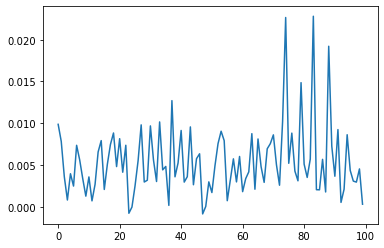

In [48]:
plt.plot(np.array(sigma_h)- np.array(sigma))

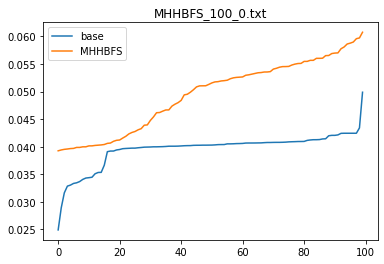

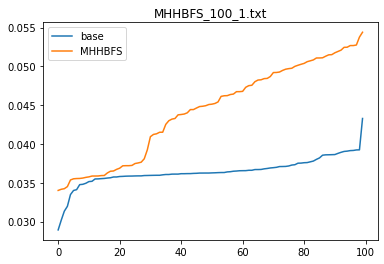

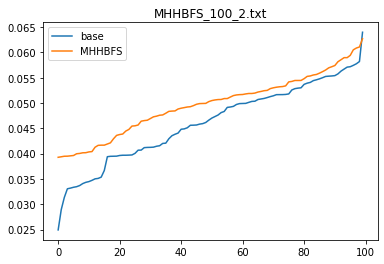

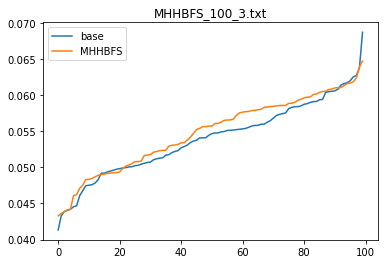

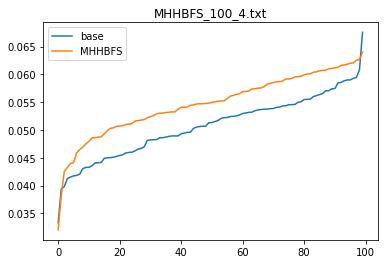

...

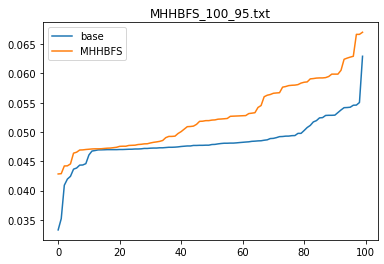

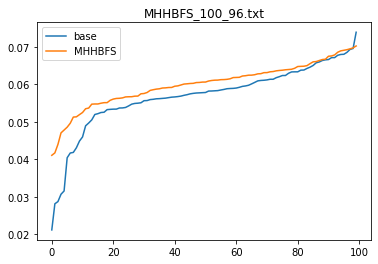

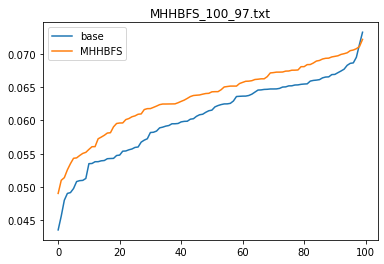

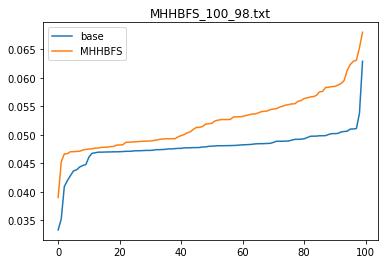

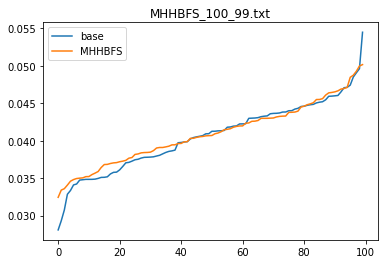

In [46]:
harmonics_avg_bfs = list()
harmonics_avg_mhh = list()
sigma = list()
sigma_h = list()
for i in range(100):
    sample = 'BFS_100_'+str(i)+'.txt'
    cents, graph = my_evaluator.evaluate_sample(sample, to_results = False)
    harmonics_avg_bfs
    sample = 'MHHBFS_100_'+str(i)+'.txt'
    cents_h, graph_h = my_evaluator.evaluate_sample(sample, to_results = False)
    col = 'harmonic'
    harmonics_avg_bfs.append(cents[col].mean())
    harmonics_avg_mhh.append(cents_h[col].mean())
    nodes = list(graph.nodes())
    x = np.array(cents[col].loc[nodes]/my_evaluator.cents[col].loc[nodes].values)
    sigma.append(np.mean(x))
    plt.plot(sorted(x), label ='base')

    nodes_h = list(graph_h.nodes())
    x = np.array(cents_h[col].loc[nodes_h]/my_evaluator.cents[col].loc[nodes_h].values)
    sigma_h.append(np.mean(x))
    plt.plot(sorted(x), label ='MHHBFS')
    plt.title(sample)
    plt.legend()
    plt.show()


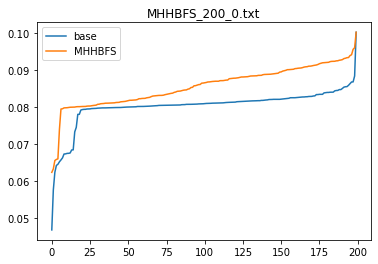

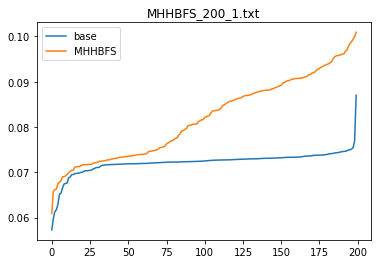

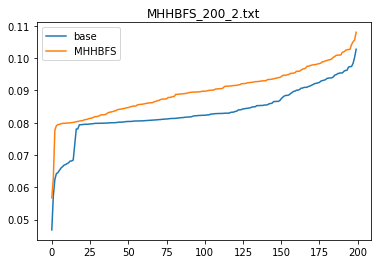

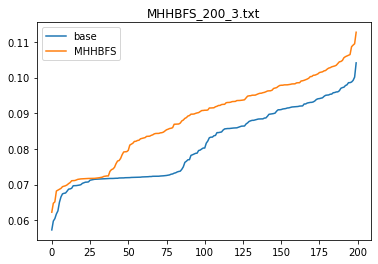

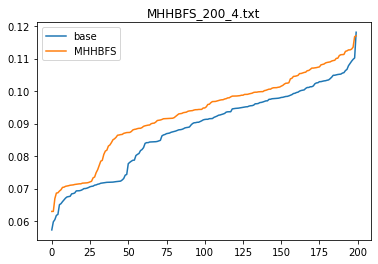

...

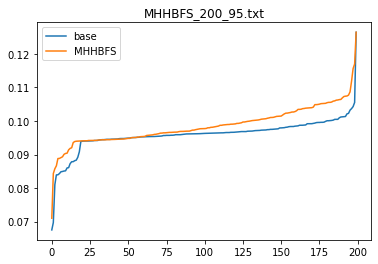

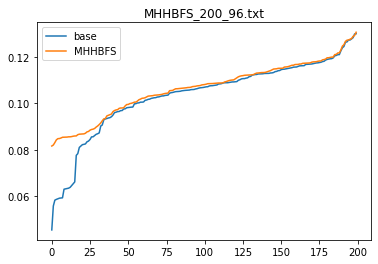

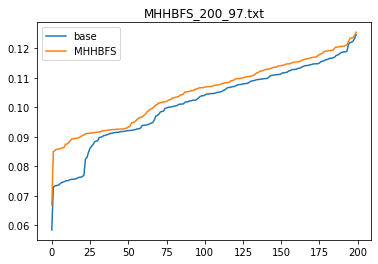

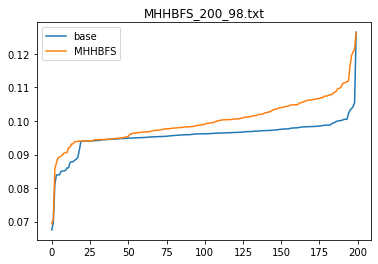

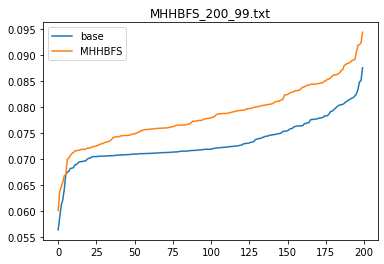

In [49]:
harmonics_avg_bfs = list()
harmonics_avg_mhh = list()
sigma = list()
sigma_h = list()
for i in range(100):
    sample = 'BFS_200_'+str(i)+'.txt'
    cents, graph = my_evaluator.evaluate_sample(sample, to_results = False)
    harmonics_avg_bfs
    sample = 'MHHBFS_200_'+str(i)+'.txt'
    cents_h, graph_h = my_evaluator.evaluate_sample(sample, to_results = False)
    col = 'harmonic'
    harmonics_avg_bfs.append(cents[col].mean())
    harmonics_avg_mhh.append(cents_h[col].mean())
    nodes = list(graph.nodes())
    x = np.array(cents[col].loc[nodes]/my_evaluator.cents[col].loc[nodes].values)
    sigma.append(np.mean(x))
    plt.plot(sorted(x), label ='base')

    nodes_h = list(graph_h.nodes())
    x = np.array(cents_h[col].loc[nodes_h]/my_evaluator.cents[col].loc[nodes_h].values)
    sigma_h.append(np.mean(x))
    plt.plot(sorted(x), label ='MHHBFS')
    plt.title(sample)
    plt.legend()
    plt.show()


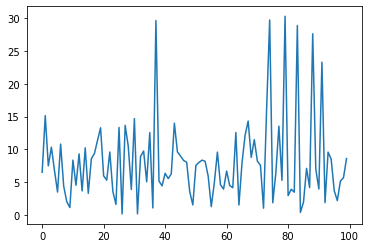

In [50]:
plt.plot(np.array(harmonics_avg_mhh)- np.array(harmonics_avg_bfs))

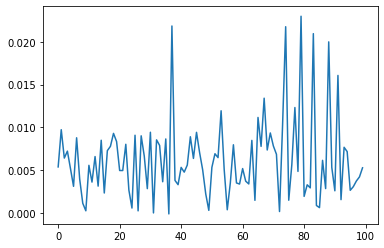

In [51]:
plt.plot(np.array(sigma_h)- np.array(sigma))

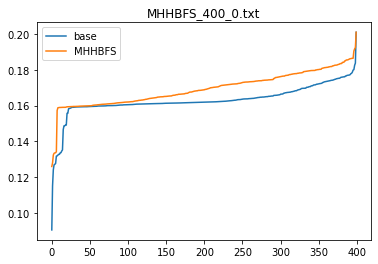

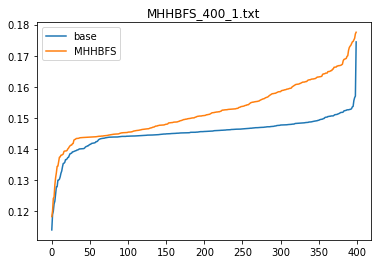

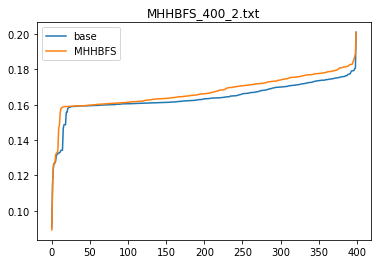

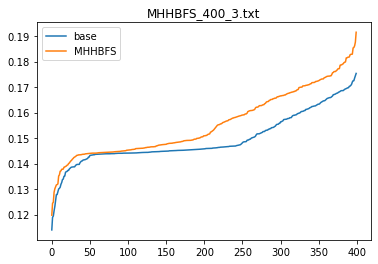

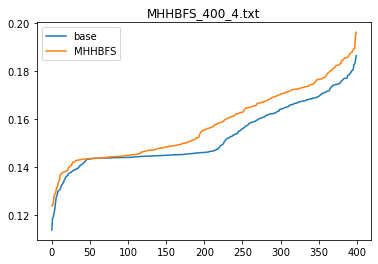

...

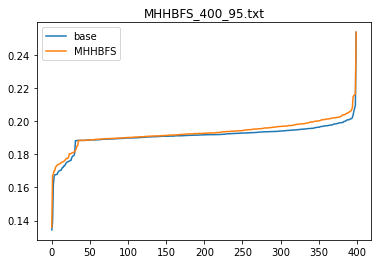

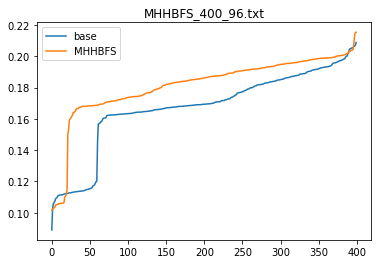

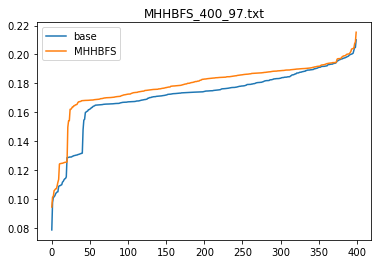

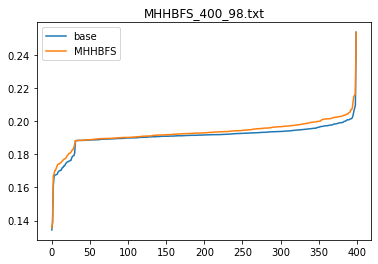

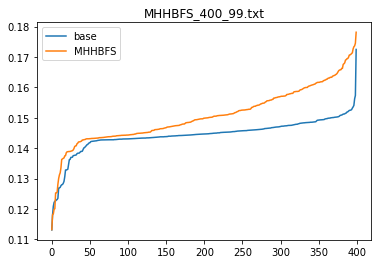

In [52]:
harmonics_avg_bfs = list()
harmonics_avg_mhh = list()
sigma = list()
sigma_h = list()
for i in range(100):
    sample = 'BFS_400_'+str(i)+'.txt'
    cents, graph = my_evaluator.evaluate_sample(sample, to_results = False)
    harmonics_avg_bfs
    sample = 'MHHBFS_400_'+str(i)+'.txt'
    cents_h, graph_h = my_evaluator.evaluate_sample(sample, to_results = False)
    col = 'harmonic'
    harmonics_avg_bfs.append(cents[col].mean())
    harmonics_avg_mhh.append(cents_h[col].mean())
    nodes = list(graph.nodes())
    x = np.array(cents[col].loc[nodes]/my_evaluator.cents[col].loc[nodes].values)
    sigma.append(np.mean(x))
    plt.plot(sorted(x), label ='base')

    nodes_h = list(graph_h.nodes())
    x = np.array(cents_h[col].loc[nodes_h]/my_evaluator.cents[col].loc[nodes_h].values)
    sigma_h.append(np.mean(x))
    plt.plot(sorted(x), label ='MHHBFS')
    plt.title(sample)
    plt.legend()
    plt.show()

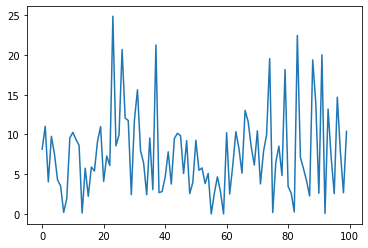

In [43]:
plt.plot(np.array(harmonics_avg_mhh)- np.array(harmonics_avg_bfs))

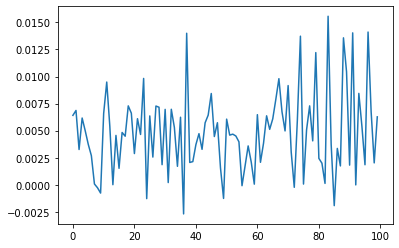

In [53]:
plt.plot(np.array(sigma_h)- np.array(sigma))

## Past

nodes = list(graph.nodes())
col = 'harmonic'
x_d = np.array(cents[col].loc[nodes]/my_evaluator.cents[col].loc[nodes].values)
plt.plot(sorted(x_d))

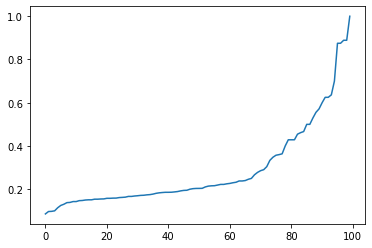

In [102]:
nodes = list(graph.nodes())
col = 'degree'
x = np.array(cents[col].loc[nodes]/my_evaluator.cents[col].loc[nodes].values)
plt.plot(sorted(x))

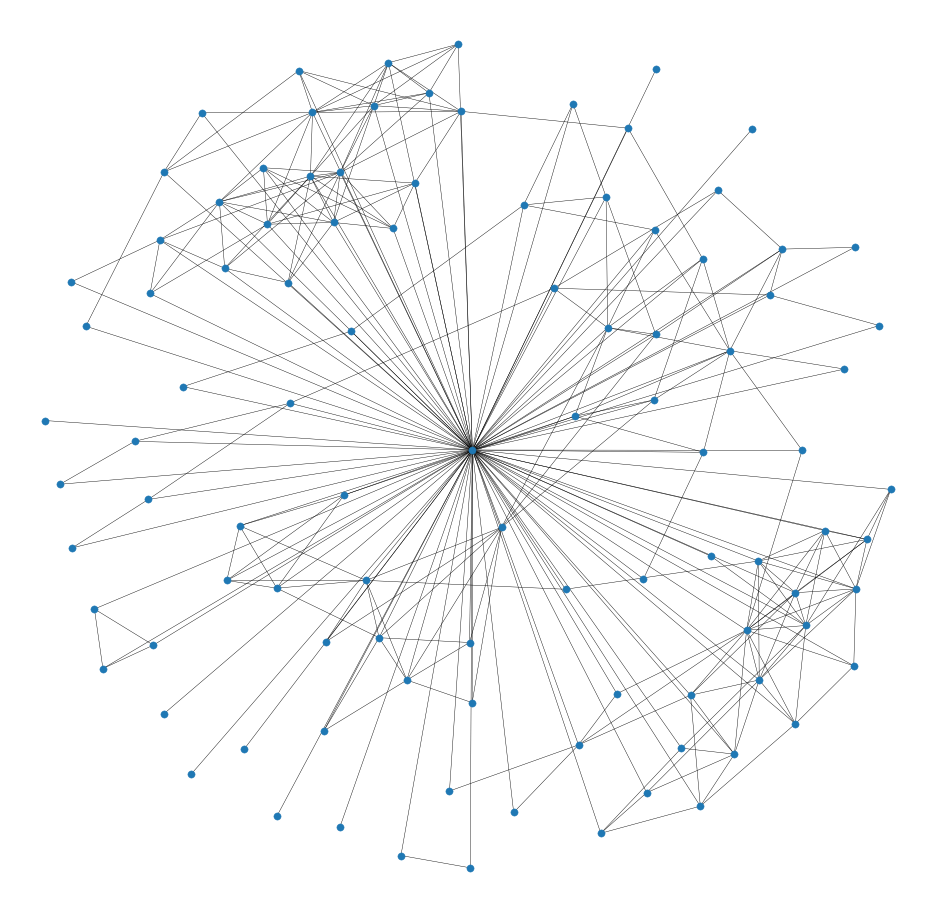

,eigenvector,closeness,information,pagerank,betweenness,harmonic,degree
58,0.064635,0.507692,0.013784,0.005621,0.000000,51.0,3
107,0.154517,0.540984,0.022056,0.021645,0.005214,57.0,15
171,0.079266,0.515625,0.017184,0.010744,0.000790,52.5,6
1684,0.592946,1.000000,0.027422,0.159851,0.912211,99.0,99
990,0.124472,0.526596,0.020188,0.014378,0.000861,54.5,10


In [125]:
sample = 'BFS_100_433.txt'
cents, graph = my_evaluator.evaluate_sample(sample, to_results = False)
draw(graph)
cents.head()

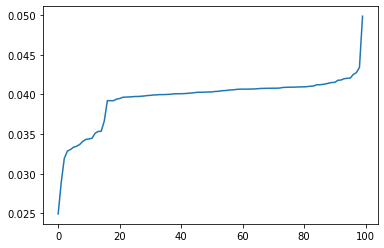

In [56]:
nodes = list(graph.nodes())
col = 'harmonic'
x_b = np.array(cents[col].loc[nodes]/my_evaluator.cents[col].loc[nodes].values)
plt.plot(sorted(x_b))

NameError: name 'x_d' is not defined

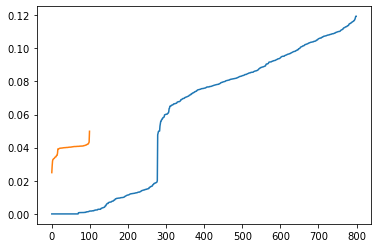

In [57]:
plt.plot(sorted(x_r), label = 'RW')
plt.plot(sorted(x_b), label = 'BFS')
plt.plot(sorted(x_d), label = 'DFS')
plt.plot(sorted(x_n), label = 'RN')
plt.legend()

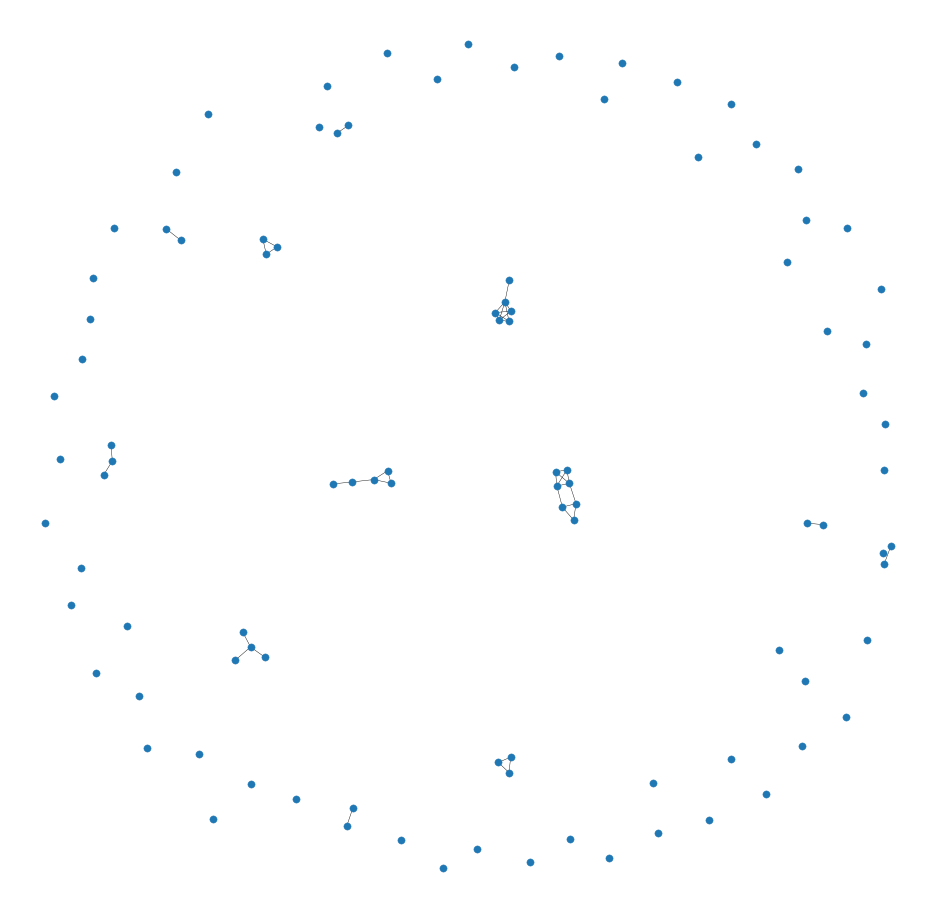

,eigenvector,closeness,pagerank,betweenness,harmonic,degree
5,1.406890e-34,0.010101,0.020060,0.000000,1.000000,1
204,1.406890e-34,0.010101,0.020060,0.000000,1.000000,1
367,5.143823e-16,0.023088,0.019240,0.000000,2.833333,2
396,5.143823e-16,0.023088,0.019240,0.000000,2.833333,2
475,6.246246e-16,0.032323,0.028426,0.000825,3.500000,3


In [92]:
sample = 'NS_100_26.txt'
cents, graph = my_evaluator.evaluate_sample(sample, to_results = False)
draw(graph)
cents.head()

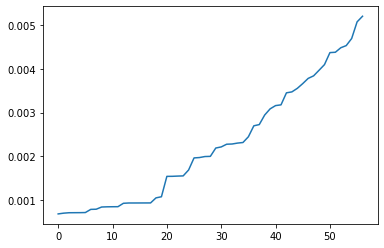

In [113]:
nodes = list(graph.nodes())
col = 'harmonic'
x_n = np.array(cents[col].loc[nodes]/my_evaluator.cents[col].loc[nodes].values)
plt.plot(sorted(x_n))

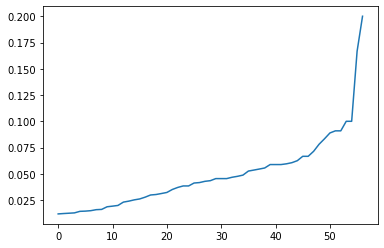

In [111]:
nodes = list(graph.nodes())
col = 'degree'
x_n = np.array(cents[col].loc[nodes]/my_evaluator.cents[col].loc[nodes].values)
plt.plot(sorted(x_n))

In [93]:
df = cents.loc[cents.index, 'betweenness']/my_evaluator.cents.loc[cents.index, 'betweenness']

In [97]:
s = ''
for x in sorted(df.values):    
    s+= str(x) 
    print(x)

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.16496411046018813
1.0594783868902018
2.8863948346802317
15.146744818659355
15.789405796661248
19.181808793470637
23.647979445969238
35.87763186360497
74.70266030536759
80.02257971527438
83.80958888291909
nan
nan
nan
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
nan
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [98]:
for x in my_evaluator.cents.loc[cents.index, 'betweenness'].values:
    print(x)

2.2059641640921933e-06
2.729575812106239e-06
2.274036713944949e-05
5.503459859402238e-06
0.004998494829229422
7.304697472270322e-07
0.00021425661604825927
9.375833655722715e-06
1.310039015527136e-05
1.2096361367309348e-05
8.83079423022538e-07
4.111654093683345e-06
5.348348418314837e-07
2.7038380868247625e-06
1.7501872558813466e-05
2.18510240651794e-06
1.041656221253974e-05
2.903900907975573e-06
0.000583711001102141
2.9057177838655637e-06
1.0416272049877315e-05
1.0658525110059083e-05
1.9152421957466326e-06
8.141744068717398e-06
5.569881588150845e-06
4.326303520766589e-05
1.70578542877141e-05
2.33749208653418e-05
1.5831472206344437e-06
3.51806125474066e-06
2.7595143525445304e-06
3.2639458688418543e-05
3.4024317725345794e-05
1.3634284124766393e-05
3.761380009930636e-05
5.977714922727492e-06
9.016214224383527e-06
1.304990660648866e-05
2.16786672537001e-05
0.00043874763488556065
0.0004877965272091784
1.3248199115866964e-05
0.0
9.669787304861854e-07
3.476182770165141e-07
3.228550071230128e-0

## Classical sampling 

In [7]:
path = './evaluations/'
name = 'Tagged_small.csv'
df = pd.read_csv(path + name)
idx = df.sample_id.apply(valid)<1000
df

,Unnamed: 0,sample_id,sampler,sample_size,eigs
0,0,NS_200_433.txt,NS,200,3326.189867
1,1,NSD_3200_43.txt,NSD,3200,0.075686
2,2,BFS_200_759.txt,BFS,200,3196.024386
3,3,BFS_100_209.txt,BFS,100,3346.240687
4,4,NSD_100_287.txt,NSD,100,2091.723127
5,5,NS_100_163.txt,NS,100,3349.186689
6,6,BFS_200_981.txt,BFS,200,3143.121724
7,7,NS_800_468.txt,NS,800,2873.123375
8,8,NS_400_965.txt,NS,400,3251.062754
9,9,NS_200_75.txt,NS,200,3349.222584


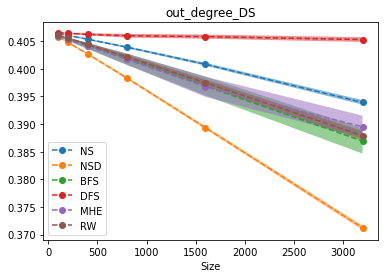

In [172]:
col = 'out_degree_DS'
x_m = dict()
x_v = dict()
sizes = sorted(df.sample_size.unique())
for sampler  in df.sampler.unique():
    x_m[sampler] = list()
    x_v[sampler] = list()
    for size in sizes:
        x_m[sampler].append(df[(df.sampler == sampler) & (df.sample_size == size)&idx][col].mean())
        x_v[sampler].append(df[(df.sampler == sampler) & (df.sample_size == size)&idx][col].std())

for sampler  in df.sampler.unique():
    x_m[sampler] = np.array(x_m[sampler])
    x_v[sampler] = np.array(x_v[sampler])
        
for sampler  in df.sampler.unique():
    plt.plot(sizes, x_m[sampler],'--o' ,label = sampler)
    plt.fill_between(sizes, x_m[sampler]-x_v[sampler],x_m[sampler]+ x_v[sampler], alpha=0.5)
plt.xlabel('Size')
plt.title(col)
plt.legend()

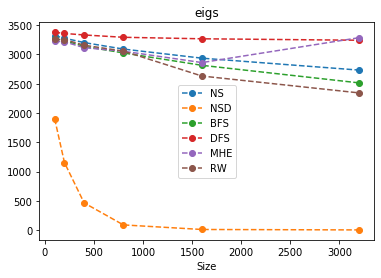

In [108]:
col = 'eigs'
x_m = dict()
x_v = dict()
sizes = sorted(df.sample_size.unique())
for sampler  in df.sampler.unique():
    x_m[sampler] = list()
    x_v[sampler] = list()
    for size in sizes:
        x_m[sampler].append(df[(df.sampler == sampler) & (df.sample_size == size)&idx][col].mean())
        x_v[sampler].append(df[(df.sampler == sampler) & (df.sample_size == size)&idx][col].var())
for sampler  in df.sampler.unique():
    plt.plot(sizes, x_m[sampler],'--o' ,label = sampler)
plt.xlabel('Size')
plt.title(col)
plt.legend()


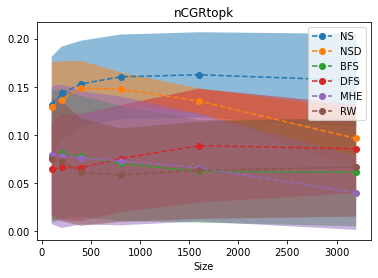

In [170]:
col = 'nCGRtopk'
x_m = dict()
x_v = dict()
sizes = sorted(df.sample_size.unique())
for sampler  in df.sampler.unique():
    x_m[sampler] = list()
    x_v[sampler] = list()
    for size in sizes:
        x_m[sampler].append(df[(df.sampler == sampler) & (df.sample_size == size)&idx][col].mean())
        x_v[sampler].append(df[(df.sampler == sampler) & (df.sample_size == size)&idx][col].std())

for sampler  in df.sampler.unique():
    x_m[sampler] = np.array(x_m[sampler])
    x_v[sampler] = np.array(x_v[sampler])
        
for sampler  in df.sampler.unique():
    plt.plot(sizes, x_m[sampler],'--o' ,label = sampler)
    plt.fill_between(sizes, x_m[sampler]-x_v[sampler],x_m[sampler]+ x_v[sampler], alpha=0.5)
plt.xlabel('Size')
plt.title(col)
plt.legend()


# eigen Experiment

In [87]:
from scipy import sparse
import scipy as sp
#path_g = '/Users/farzan/Downloads/data/spam/small/relations.csv'
path_g = '/Users/farzan/Desktop/Projects/Codes/GraphPartition/Fennel/data/Tagged/small/relations.csv'
dtype = {"day": np.int64, "time_ms": np.int64, 'src': np.int64, 'dst': np.int64, 'type': np.int64}
chunk_size = 10**7
sep = ','
names = ['day', 'time_ms', 'src', 'dst', 'type']
users = pd.read_csv('/Users/farzan/Desktop/Projects/Codes/GraphPartition/Fennel/data/Tagged/small/usersdata.csv')
# users = pd.read_csv('/Users/farzan/Desktop/Projects/Codes/GraphPartition/Fennel/data/Tagged/usersdata.csv',
#                     sep='\t',index_col=0, names=['userId', 'sex','timePassedValidation', 'ageGroup','label'])
# map_id_to_node = dict()
# map_node_to_id = dict()
# for ct, node in  enumerate(nodes):
#     map_id_to_node[ct] = node
#     map_node_to_id[node] = ct
# n = len(users.index)
#adj = sp.sparse.csr_matrix((n,n))
# for chunk in tqdm(pd.read_csv(path_g, sep=sep, names= names, chunksize=chunk_size)):
#     if dtype is None:
#         chunk = chunk.dropna(axis=0, how='any')
#     else:
#         chunk = chunk.dropna(axis=0, how='any').astype(dtype)
nodes = set()
for chunk in pd.read_csv(path_g, sep=sep, chunksize=chunk_size):
    chunk = chunk.dropna(axis=0, how='any')
    nodes = nodes.union(set(chunk.src.unique()))
    nodes = nodes.union(set(chunk.dst.unique()))
nodes = sorted(list(nodes))
map_id_to_node = dict()
map_node_to_id = dict()
for ct, node in  enumerate(nodes):
    map_id_to_node[ct] = node
    map_node_to_id[node] = ct
n = len(nodes)
adj = sp.sparse.csr_matrix((n,n))
for chunk in pd.read_csv(path_g, sep=sep, chunksize=chunk_size):
    chunk = chunk.dropna(axis=0, how='any')
    chunk['src'] = chunk['src'].apply(lambda x : map_node_to_id[x])
    chunk['dst'] = chunk['dst'].apply(lambda x : map_node_to_id[x])
    row = [v[0]for v in chunk.groupby(['src','dst']).size().index]
    col = [v[1]for v in chunk.groupby(['src','dst']).size().index]
    adj += sp.sparse.csr_matrix((chunk.groupby(['src','dst']).size().values, (row,col)), shape=(n, n))


In [91]:
from scipy.sparse import linalg
eigenvalues_l, eigenvectors = sp.sparse.linalg.eigsh(adj, k= 10, which= 'LA')
eigenvalues_s, eigenvectors = sp.sparse.linalg.eigsh(adj, k= 10, which= 'SA')

In [90]:
eigenvalues_l

array([ 632.13495316,  634.51040387,  650.94113377,  761.28831979,
        831.90041879,  842.93679854,  986.7957886 , 1272.16495573,
       2168.56745643, 2309.99376132])

In [92]:
eigenvalues_s

array([-549.46941091, -323.10077813, -250.31944817, -222.78094867,
       -220.35691795, -212.81004852, -189.68848484, -152.18686472,
       -143.65433039, -139.0047517 ])

# eigen values experiment results

In [57]:

def get(rank , path , sizes ):
    mean = list()
    var = list()
    std = list()
    max_v = list()
    min_v = list()
    for i in sizes:
        result = pd.read_csv(path+ str(i)+'.csv', header = None)
        mean.append(result[rank].mean())
        var.append(result[rank].var())
        std.append(result[rank].std())
        max_v.append(result[rank].max())
        min_v.append(result[rank].min())
    mean = np.array(mean)
    var = np.array(var)
    std = np.array(std)
    max_v= np.array(max_v)
    min_v= np.array(min_v)
    return mean, var, std, max_v, min_v

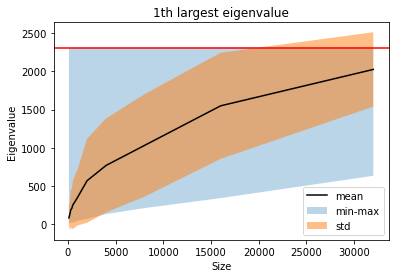

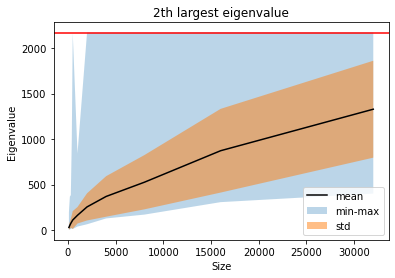

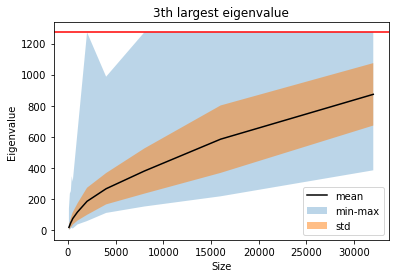

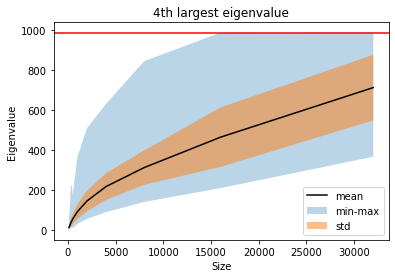

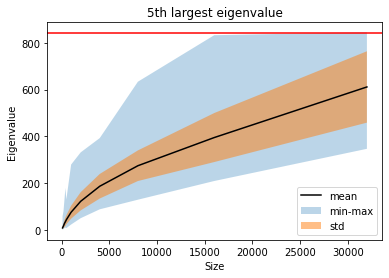

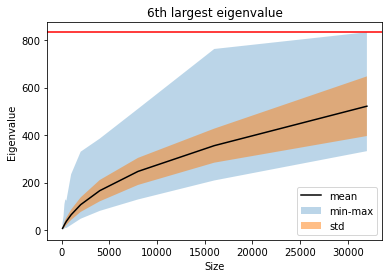

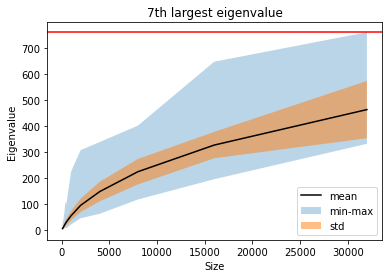

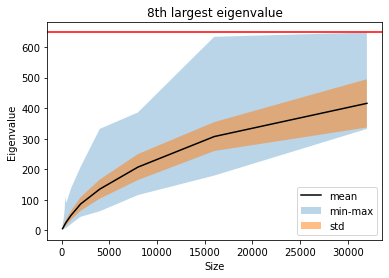

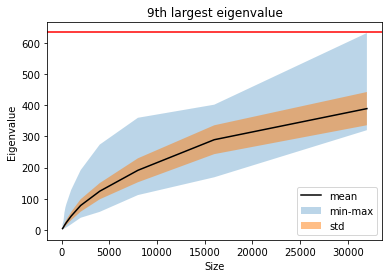

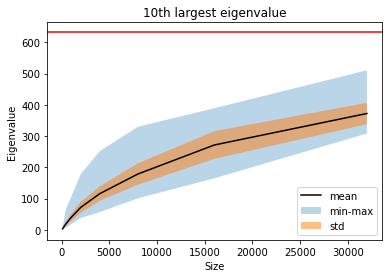

In [102]:
path = './logs/'+'eigs_l_NS_'
sizes = [100, 200,300 ,400, 500, 1000, 2000, 4000, 8000,16000, 32000]
for rank in reversed(range(10)):
    mean, var,std, max_v, min_v = get(rank = rank , path = path , sizes = sizes)
    plt.plot(sizes, mean, 'k-', label= 'mean')
    plt.axhline(eigenvalues_l[rank],color= 'red')
    plt.fill_between(sizes, min_v, max_v, alpha=0.3, label= 'min-max')
    plt.fill_between(sizes, mean-std,mean+ std, alpha=0.5, label= 'std')
    plt.xlabel('Size')
    plt.ylabel('Eigenvalue')
    plt.title(str(10-rank)+ 'th largest eigenvalue')
    plt.legend()
    plt.show()

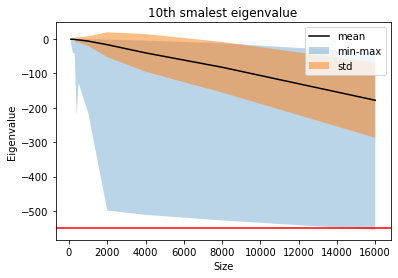

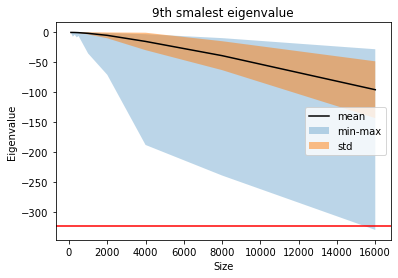

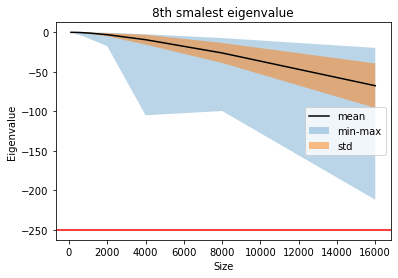

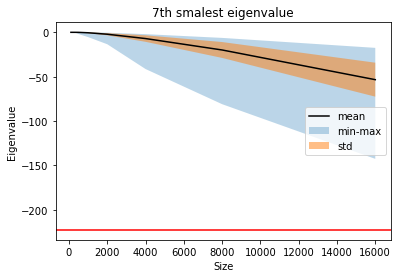

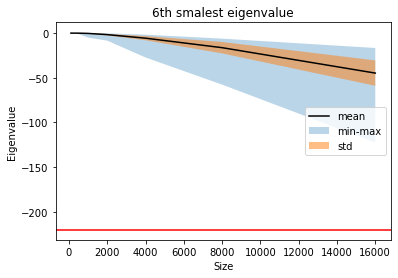

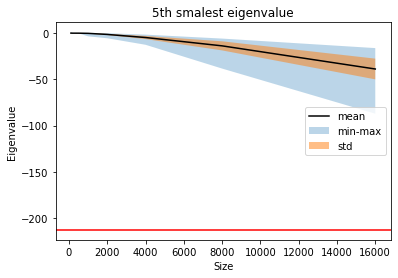

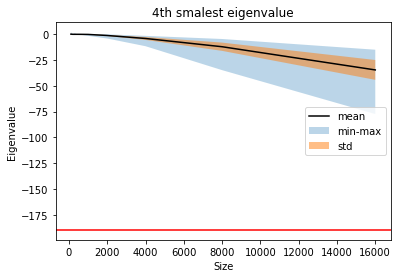

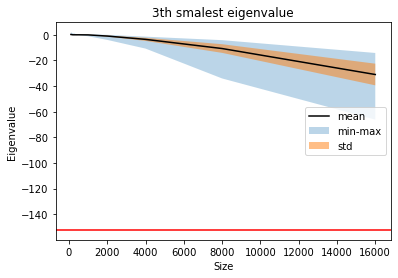

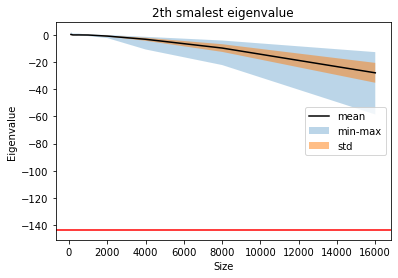

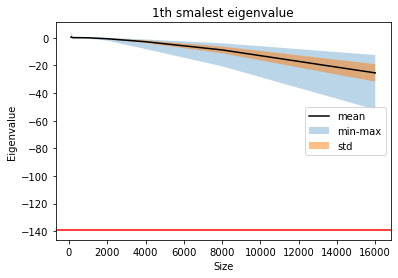

In [100]:
path = './logs/'+'eigs_s_NS_'
#sizes = [100, 200,300 ,400, 500, 1000, 2000, 4000]
for rank in range(10):
    mean, var,std, max_v, min_v = get(rank = rank , path = path , sizes = sizes)
    plt.plot(sizes, mean, 'k-', label= 'mean')
    plt.axhline(eigenvalues_s[rank],color= 'red')
    plt.fill_between(sizes, min_v, max_v, alpha=0.3, label= 'min-max')
    plt.fill_between(sizes, mean-std,mean+ std, alpha=0.5, label= 'std')

    plt.xlabel('Size')
    plt.ylabel('Eigenvalue')
    plt.title(str(10-rank)+ 'th smalest eigenvalue')
    plt.legend()
    plt.show()

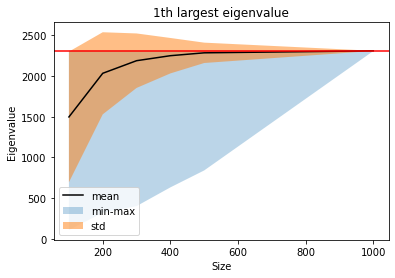

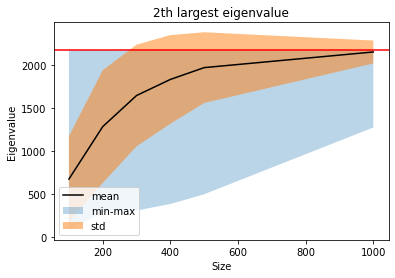

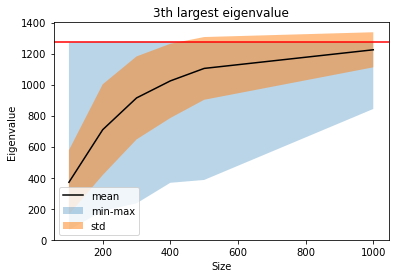

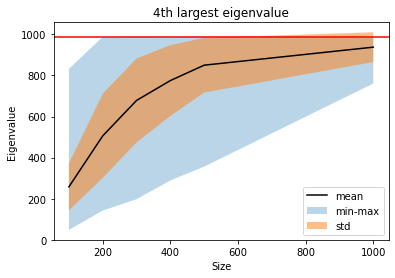

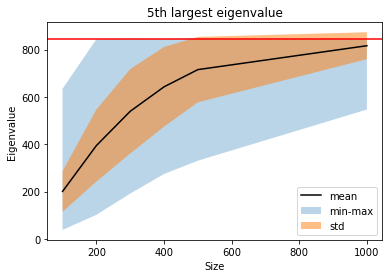

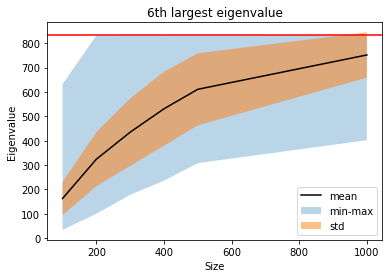

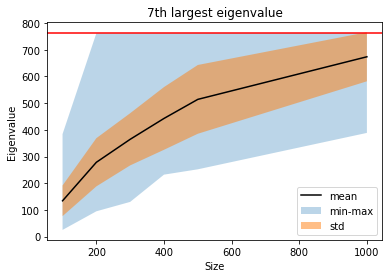

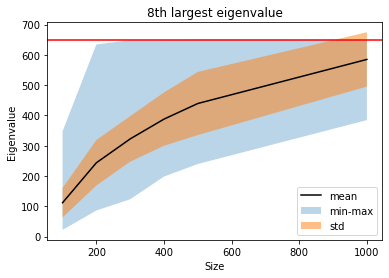

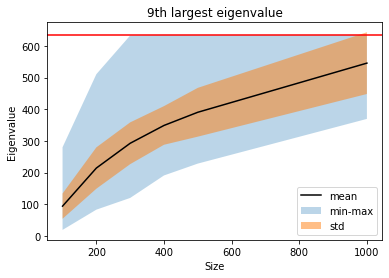

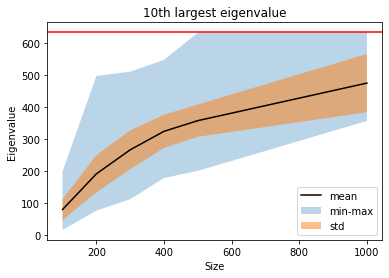

In [149]:
path = './logs/'+'eigs_l_NSD_'
sizes = [100, 200,300 ,400, 500, 1000]#, 2000, 4000, 8000,16000, 32000]
for rank in reversed(range(10)):
    mean, var,std, max_v, min_v = get(rank = rank , path = path , sizes = sizes)
    plt.plot(sizes, mean, 'k-', label= 'mean')
    plt.axhline(eigenvalues_l[rank],color= 'red')
    plt.fill_between(sizes, min_v, max_v, alpha=0.3, label= 'min-max')
    plt.fill_between(sizes, mean-std,mean+ std, alpha=0.5, label= 'std')
    plt.xlabel('Size')
    plt.ylabel('Eigenvalue')
    plt.title(str(10-rank)+ 'th largest eigenvalue')
    plt.legend()
    plt.show()

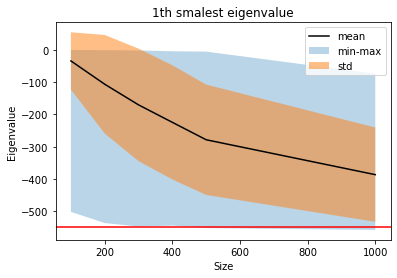

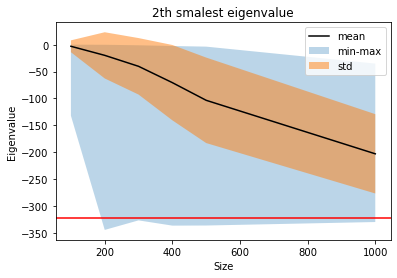

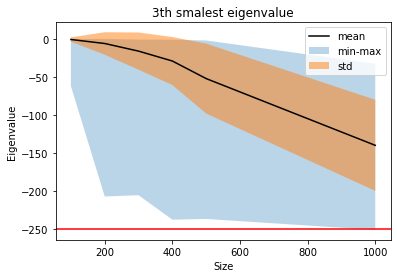

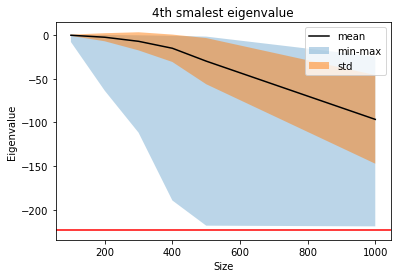

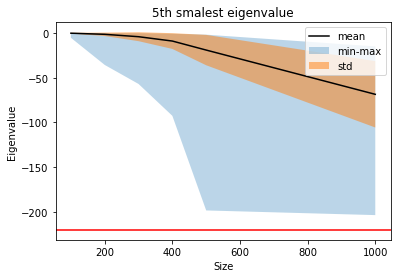

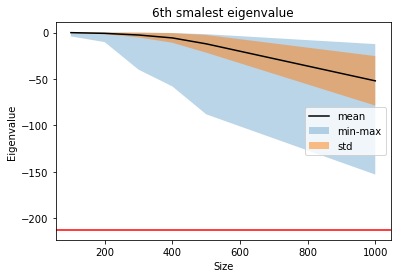

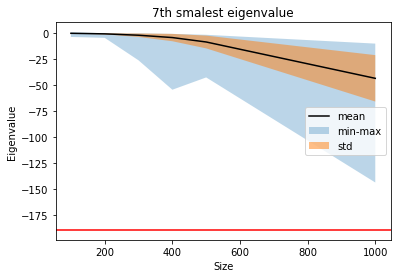

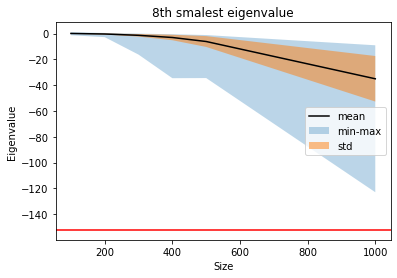

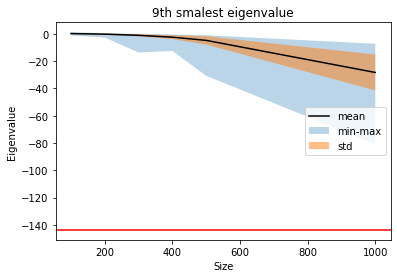

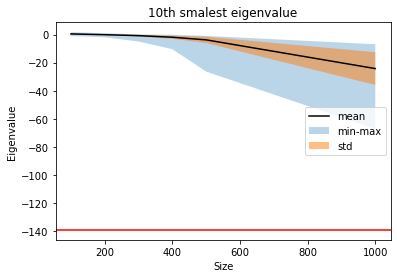

In [150]:
path = './logs/'+'eigs_s_NSD_'
#sizes = [100, 200,300 ,400, 500, 1000, 2000, 4000]
for rank in range(10):
    mean, var,std, max_v, min_v = get(rank = rank , path = path , sizes = sizes)
    plt.plot(sizes, mean, 'k-', label= 'mean')
    plt.axhline(eigenvalues_s[rank],color= 'red')
    plt.fill_between(sizes, min_v, max_v, alpha=0.3, label= 'min-max')
    plt.fill_between(sizes, mean-std,mean+ std, alpha=0.5, label= 'std')

    plt.xlabel('Size')
    plt.ylabel('Eigenvalue')
    plt.title(str(1+rank)+ 'th smalest eigenvalue')
    plt.legend()
    plt.show()

In [153]:
path = './logs/'+'eigs_l_NS_'
sizes = [100, 200,300 ,400, 500, 1000, 2000]#, 4000, 8000,16000, 32000]
means = list()
stds = list()
maxs = list()
mins = list()
for i in sizes:
    norms = list()
    result = pd.read_csv(path+ str(i)+'.csv', header = None)
    for i in range(result.shape[0]):
        norms.append(np.linalg.norm(eigenvalues_l- result.loc[i].to_numpy()))
    means.append(np.mean(norms))
    stds.append(np.std(norms))
    maxs.append(np.max(norms))
    mins.append(np.min(norms))
means = np.array(means)
stds = np.array(stds)
maxs = np.array(maxs)
mins = np.array(mins)

In [158]:
path = './logs/'+'eigs_l_NSD_'
sizes = [100, 200,300 ,400, 500, 1000, 2000]#, 4000, 8000,16000, 32000]
means_d = list()
stds_d = list()
maxs_d = list()
mins_d = list()
for i in sizes:
    norms = list()
    result = pd.read_csv(path+ str(i)+'.csv', header = None)
    for i in range(result.shape[0]):
        norms.append(np.linalg.norm(eigenvalues_l- result.loc[i].to_numpy()))
    means_d.append(np.mean(norms))
    stds_d.append(np.std(norms))
    maxs_d.append(np.max(norms))
    mins_d.append(np.min(norms))
means_d = np.array(means_d)
stds_d = np.array(stds_d)
maxs_d = np.array(maxs_d)
mins_d = np.array(mins_d)

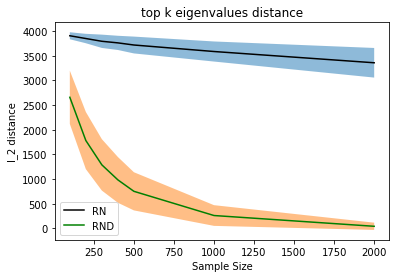

In [159]:
plt.plot(sizes, means, 'k-', label= 'RN')
plt.plot(sizes, means_d, 'g-', label= 'RND')
#plt.fill_between(sizes, mins, maxs, alpha=0.3, label= 'min-max')
plt.fill_between(sizes, means-stds,means+ stds, alpha=0.5)
plt.fill_between(sizes, means_d-stds_d,means_d+ stds_d, alpha=0.5)
plt.xlabel('Sample Size')
plt.ylabel('l_2 distance')
plt.title('top k eigenvalues distance')
plt.legend()
plt.show()

In [160]:
path = './logs/'+'eigs_s_NS_'
sizes = [100, 200,300 ,400, 500, 1000, 2000]#, 4000, 8000,16000, 32000]
means = list()
stds = list()
maxs = list()
mins = list()
for i in sizes:
    norms = list()
    result = pd.read_csv(path+ str(i)+'.csv', header = None)
    for i in range(result.shape[0]):
        norms.append(np.linalg.norm(eigenvalues_s- result.loc[i].to_numpy()))
    means.append(np.mean(norms))
    stds.append(np.std(norms))
    maxs.append(np.max(norms))
    mins.append(np.min(norms))
means = np.array(means)
stds = np.array(stds)
maxs = np.array(maxs)
mins = np.array(mins)

In [161]:
path = './logs/'+'eigs_s_NSD_'
sizes = [100, 200,300 ,400, 500, 1000, 2000]#, 4000, 8000,16000, 32000]
means_d = list()
stds_d = list()
maxs_d = list()
mins_d = list()
for i in sizes:
    norms = list()
    result = pd.read_csv(path+ str(i)+'.csv', header = None)
    for i in range(result.shape[0]):
        norms.append(np.linalg.norm(eigenvalues_s- result.loc[i].to_numpy()))
    means_d.append(np.mean(norms))
    stds_d.append(np.std(norms))
    maxs_d.append(np.max(norms))
    mins_d.append(np.min(norms))
means_d = np.array(means_d)
stds_d = np.array(stds_d)
maxs_d = np.array(maxs_d)
mins_d = np.array(mins_d)

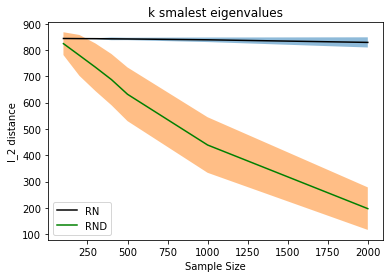

In [162]:
plt.plot(sizes, means, 'k-', label= 'RN')
plt.plot(sizes, means_d, 'g-', label= 'RND')
#plt.fill_between(sizes, mins, maxs, alpha=0.3, label= 'min-max')
plt.fill_between(sizes, means-stds,means+ stds, alpha=0.5)
plt.fill_between(sizes, means_d-stds_d,means_d+ stds_d, alpha=0.5)
plt.xlabel('Sample Size')
plt.ylabel('l_2 distance')
plt.title('k smalest eigenvalues')
plt.legend()
plt.show()

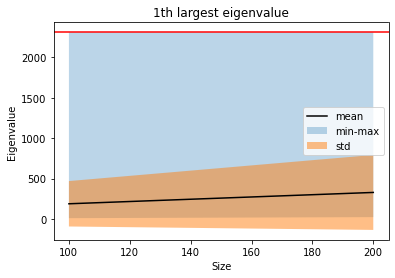

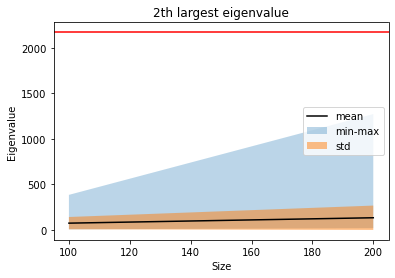

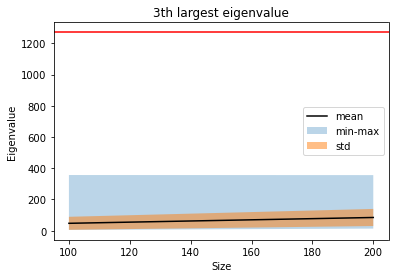

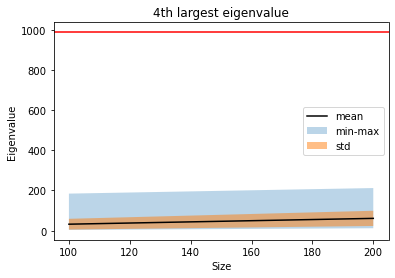

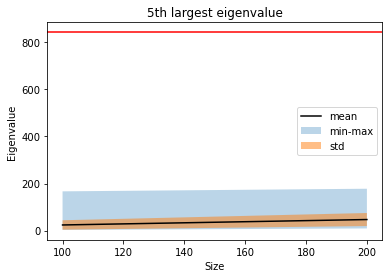

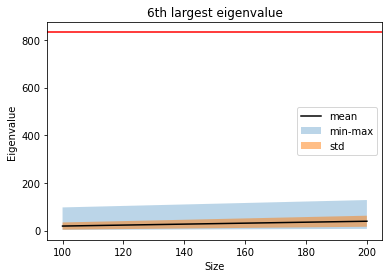

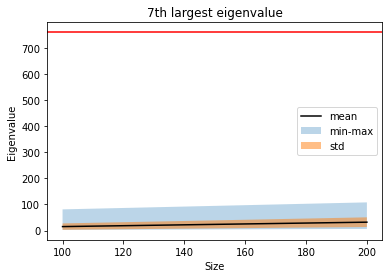

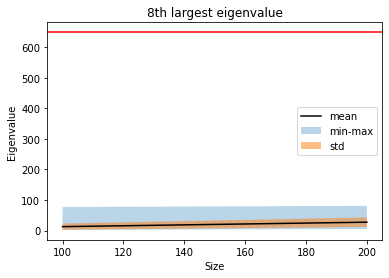

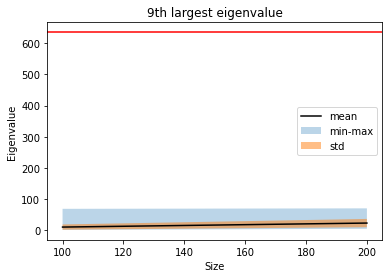

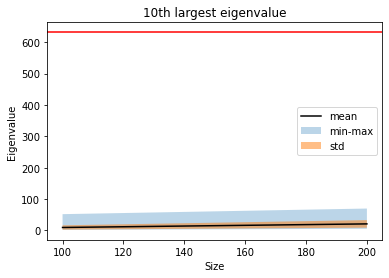

In [164]:
path = './logs/'+'eigs_l_RW_'
sizes = [100, 200]#,300 ,400, 500, 1000]#, 2000, 4000, 8000,16000, 32000]
for rank in reversed(range(10)):
    mean, var,std, max_v, min_v = get(rank = rank , path = path , sizes = sizes)
    plt.plot(sizes, mean, 'k-', label= 'mean')
    plt.axhline(eigenvalues_l[rank],color= 'red')
    plt.fill_between(sizes, min_v, max_v, alpha=0.3, label= 'min-max')
    plt.fill_between(sizes, mean-std,mean+ std, alpha=0.5, label= 'std')
    plt.xlabel('Size')
    plt.ylabel('Eigenvalue')
    plt.title(str(10-rank)+ 'th largest eigenvalue')
    plt.legend()
    plt.show()